In [1]:
# --- Difference DA vs OL for selected metrics, flatten, and plot (one map per metric) ---

from pathlib import Path
import sys
import numpy as np
import xarray as xr

REPO_ROOT = Path.cwd().resolve()
if not (REPO_ROOT / "common/python/plotting/geospatial_plotting.py").exists():
    for parent in REPO_ROOT.parents:
        if (parent / "common/python/plotting/geospatial_plotting.py").exists():
            REPO_ROOT = parent
            break
sys.path.insert(0, str(REPO_ROOT / "common/python/plotting"))

from geospatial_plotting import plot_region, REGION_BOUNDS

FN_DA = str(REPO_ROOT / "projects/era5_land/notebooks/ERA5_vs_DAv8_M36_strict_summary.nc")
FN_OL = str(REPO_ROOT / "projects/era5_land/notebooks/ERA5_vs_OLv8_M36_strict_summary.nc")
out_csv = "ERA5_periodized_metrics_summary.csv"

# FN_DA = str(REPO_ROOT / "ERA5_vs_DAv8_M36_summary.nc")
# FN_OL = str(REPO_ROOT / "ERA5_vs_OLv8_M36_summary.nc")
# out_csv = "ERA5_periodized_metrics_summary.csv"

# Cache controls for periodized metric recomputation
USE_CACHE = True
REBUILD_CACHE = False   # set True to force recompute and overwrite cache
CACHE_DIR = REPO_ROOT / "cache" / "era5_periodized_metrics"
CACHE_DIR.mkdir(parents=True, exist_ok=True)

metrics = ['anomR_sfc', 'ubRMSE_sfc', 'anomR_rz', 'ubRMSE_rz', 'anomR_scf', 'ubRMSE_scf', 'anomR_swe', 'ubRMSE_swe', 'anomR_snwd', 'ubRMSE_snwd']




/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/pyproj/network.py:59: UserWarning: pyproj unable to set PROJ database path.
  _set_context_ca_bundle_path(ca_bundle_path)


In [2]:
def anomalies_monthly(da, dim="time"):
    """
    Monthly anomalies: remove month-of-year climatology (NaN-safe).
    """
    clim = da.groupby(f"{dim}.month").mean(dim=dim, skipna=True)
    return da.groupby(f"{dim}.month") - clim

def anom_metrics_monthly(a, b, dim="time", min_pairs=24):
    """
    NaN-safe anomR and ubRMSE on valid pairs only.
    Enforces a minimum number of valid pairs (default 24 months).
    """
    valid = xr.where(xr.ufuncs.isfinite(a) & xr.ufuncs.isfinite(b), True, False)
    n = valid.sum(dim=dim)

    a_v = a.where(valid)
    b_v = b.where(valid)

    cov   = (a_v * b_v).mean(dim=dim, skipna=True)
    var_a = (a_v**2).mean(dim=dim, skipna=True)
    var_b = (b_v**2).mean(dim=dim, skipna=True)

    denom = xr.ufuncs.sqrt(var_a * var_b)
    anomR  = xr.where(denom > 0, cov / denom, np.nan)
    ubRMSE = xr.ufuncs.sqrt(((a_v - b_v)**2).mean(dim=dim, skipna=True))

    # require enough valid months
    anomR  = xr.where(n >= min_pairs, anomR, np.nan)
    ubRMSE = xr.where(n >= min_pairs, ubRMSE, np.nan)
    return anomR, ubRMSE

def corr_monthly(a, b, dim="time", min_pairs=24):
    """
    Pearson R on raw monthly series (no anomaly removal).
    NaN-safe; requires at least `min_pairs` valid months.
    """
    valid = xr.where(xr.ufuncs.isfinite(a) & xr.ufuncs.isfinite(b), True, False)
    n = valid.sum(dim=dim)

    a_v = a.where(valid)
    b_v = b.where(valid)

    # remove means over time (on valid pairs only)
    a_dm = a_v - a_v.mean(dim=dim, skipna=True)
    b_dm = b_v - b_v.mean(dim=dim, skipna=True)

    cov   = (a_dm * b_dm).mean(dim=dim, skipna=True)
    var_a = (a_dm**2).mean(dim=dim, skipna=True)
    var_b = (b_dm**2).mean(dim=dim, skipna=True)

    denom = xr.ufuncs.sqrt(var_a * var_b)
    R = xr.where(denom > 0, cov / denom, np.nan)

    # require enough valid months
    R = xr.where(n >= min_pairs, R, np.nan)
    return R

def rmse_bias_monthly(a, b, dim="time", min_pairs=24):
    """
    NaN-safe RMSE and bias on raw monthly series (valid pairs only).
    Requires at least `min_pairs` valid months.
    """
    valid = xr.where(xr.ufuncs.isfinite(a) & xr.ufuncs.isfinite(b), True, False)
    n = valid.sum(dim=dim)

    a_v = a.where(valid)
    b_v = b.where(valid)
    diff = a_v - b_v

    rmse = xr.ufuncs.sqrt((diff**2).mean(dim=dim, skipna=True))
    bias = diff.mean(dim=dim, skipna=True)

    rmse = xr.where(n >= min_pairs, rmse, np.nan)
    bias = xr.where(n >= min_pairs, bias, np.nan)
    return rmse, bias


In [3]:
# --- Recompute monthly anomaly metrics over limited time periods ---
# Reuses: anomalies_monthly(), anom_metrics_monthly()

import numpy as np
import xarray as xr
import pandas as pd

# Files to process (do one or both)
FILES = [
    FN_DA,
    FN_OL,
]

# Sub-periods (inclusive)
PERIODS = [
    ("2000-06-01", "2007-05-31"),
    ("2007-06-01", "2015-03-31"),
    ("2015-04-01", "2024-05-31"),
    ("2000-06-01", "2024-05-31"),
]

MIN_PAIRS = 24  # minimum valid months for metrics

def compute_metrics_for_period(ds, t0, t1, min_pairs=24, snow_eps=0.01):
    import xarray as xr
    import numpy as np
    import pandas as pd

    sub = xr.decode_cf(ds).sel(time=slice(pd.to_datetime(t0), pd.to_datetime(t1)))

    for v in ["SM_model","SM_era","SCF_model","SCF_era"]:
        if v not in sub:
            raise KeyError(f"Required variable '{v}' missing from dataset.")

    mask_both = sub["mask_both"] if "mask_both" in sub else xr.full_like(sub["SM_model"], True, dtype=bool)

    # ----- Surface SM -----
    sm_mod_raw = sub["SM_model"].where(mask_both).astype("float64")
    sm_era_raw = sub["SM_era"  ].where(mask_both).astype("float64")

    # anomalies → anomR & ubRMSE (unchanged)
    sm_mod_an = anomalies_monthly(sm_mod_raw)
    sm_era_an = anomalies_monthly(sm_era_raw)
    anomR_sfc, ubRMSE_sfc = anom_metrics_monthly(sm_mod_an, sm_era_an, min_pairs=min_pairs)

    # raw correlation R
    R_sfc = corr_monthly(sm_mod_raw, sm_era_raw, min_pairs=min_pairs)

    # ----- Root-zone SM (if present) -----
    if ("RZ_model" in sub) and ("RZ_era" in sub):
        rz_mod_raw = sub["RZ_model"].where(mask_both).astype("float64")
        rz_era_raw = sub["RZ_era"  ].where(mask_both).astype("float64")

        rz_mod_an = anomalies_monthly(rz_mod_raw)
        rz_era_an = anomalies_monthly(rz_era_raw)
        anomR_rz,  ubRMSE_rz  = anom_metrics_monthly(rz_mod_an, rz_era_an, min_pairs=min_pairs)
        R_rz = corr_monthly(rz_mod_raw, rz_era_raw, min_pairs=min_pairs)
    else:
        anomR_rz  = xr.full_like(anomR_sfc, np.nan)
        ubRMSE_rz = xr.full_like(ubRMSE_sfc, np.nan)
        R_rz      = xr.full_like(anomR_sfc, np.nan)

    # ----- SCF (ever-snow mask over FULL record) -----
    snow_any  = ((ds["SCF_model"] > snow_eps) | (ds["SCF_era"] > snow_eps)).any(dim="time")
    snow_mask = xr.where(snow_any, True, False)

    scf_mod_raw = sub["SCF_model"].where(snow_mask).astype("float64")
    scf_era_raw = sub["SCF_era"  ].where(snow_mask).astype("float64")

    scf_mod_an = anomalies_monthly(scf_mod_raw)
    scf_era_an = anomalies_monthly(scf_era_raw)
    anomR_scf,  ubRMSE_scf = anom_metrics_monthly(scf_mod_an, scf_era_an, min_pairs=min_pairs)
    R_scf = corr_monthly(scf_mod_raw, scf_era_raw, min_pairs=min_pairs)
    rmse_scf, bias_scf = rmse_bias_monthly(scf_mod_raw, scf_era_raw, min_pairs=min_pairs)

    # ----- SWE (optional; use ever-snow mask) -----
    if ("SWE_model" in sub) and ("SWE_era" in sub):
        swe_mod_raw = sub["SWE_model"].where(snow_mask).astype("float64")
        swe_era_raw = sub["SWE_era"  ].where(snow_mask).astype("float64")

        swe_mod_an = anomalies_monthly(swe_mod_raw)
        swe_era_an = anomalies_monthly(swe_era_raw)
        anomR_swe, ubRMSE_swe = anom_metrics_monthly(swe_mod_an, swe_era_an, min_pairs=min_pairs)
        R_swe = corr_monthly(swe_mod_raw, swe_era_raw, min_pairs=min_pairs)
        rmse_swe, bias_swe = rmse_bias_monthly(swe_mod_raw, swe_era_raw, min_pairs=min_pairs)
    else:
        anomR_swe = xr.full_like(anomR_sfc, np.nan)
        ubRMSE_swe = xr.full_like(ubRMSE_sfc, np.nan)
        R_swe = xr.full_like(anomR_sfc, np.nan)
        rmse_swe = xr.full_like(ubRMSE_sfc, np.nan)
        bias_swe = xr.full_like(anomR_sfc, np.nan)

    # ----- Snow depth (optional; use ever-snow mask) -----
    if ("SNWD_model" in sub) and ("SNWD_era" in sub):
        snwd_mod_raw = sub["SNWD_model"].where(snow_mask).astype("float64")
        snwd_era_raw = sub["SNWD_era"  ].where(snow_mask).astype("float64")

        snwd_mod_an = anomalies_monthly(snwd_mod_raw)
        snwd_era_an = anomalies_monthly(snwd_era_raw)
        anomR_snwd, ubRMSE_snwd = anom_metrics_monthly(snwd_mod_an, snwd_era_an, min_pairs=min_pairs)
        R_snwd = corr_monthly(snwd_mod_raw, snwd_era_raw, min_pairs=min_pairs)
        rmse_snwd, bias_snwd = rmse_bias_monthly(snwd_mod_raw, snwd_era_raw, min_pairs=min_pairs)
    else:
        anomR_snwd = xr.full_like(anomR_sfc, np.nan)
        ubRMSE_snwd = xr.full_like(ubRMSE_sfc, np.nan)
        R_snwd = xr.full_like(anomR_sfc, np.nan)
        rmse_snwd = xr.full_like(ubRMSE_sfc, np.nan)
        bias_snwd = xr.full_like(anomR_sfc, np.nan)

    return xr.Dataset(dict(
        # anomalies-based metrics
        anomR_sfc=anomR_sfc,   ubRMSE_sfc=ubRMSE_sfc,
        anomR_rz=anomR_rz,     ubRMSE_rz=ubRMSE_rz,
        anomR_scf=anomR_scf,   ubRMSE_scf=ubRMSE_scf, rmse_scf=rmse_scf, bias_scf=bias_scf,
        anomR_swe=anomR_swe,   ubRMSE_swe=ubRMSE_swe, rmse_swe=rmse_swe, bias_swe=bias_swe,
        anomR_snwd=anomR_snwd, ubRMSE_snwd=ubRMSE_snwd, rmse_snwd=rmse_snwd, bias_snwd=bias_snwd,
        # raw correlations
        R_sfc=R_sfc, R_rz=R_rz, R_scf=R_scf, R_swe=R_swe, R_snwd=R_snwd,
    ))


# Process each file → stack results along "period" (with optional on-disk cache)
import hashlib


def _cache_file_for(fn, periods, min_pairs):
    stem = Path(fn).stem
    sig = {
        "fn": str(Path(fn).resolve()),
        "periods": periods,
        "min_pairs": int(min_pairs),
        "schema": "periodized_metrics_v2",
    }
    key = hashlib.md5(repr(sig).encode("utf-8")).hexdigest()[:12]
    return CACHE_DIR / f"{stem}__{key}.nc"


results = {}
for fn in FILES:
    cache_file = _cache_file_for(fn, PERIODS, MIN_PAIRS)

    if USE_CACHE and cache_file.exists() and not REBUILD_CACHE:
        ds_cached = xr.open_dataset(cache_file)
        ds_all = ds_cached.load()
        ds_cached.close()
        results[fn] = ds_all
        print(f"Loaded cached periodized metrics: {cache_file}")
        continue

    ds = xr.open_dataset(fn)
    # ensure CF-time decoding just in case
    ds = xr.decode_cf(ds)

    per_list = []
    per_labels = []
    for (t0, t1) in PERIODS:
        ds_per = compute_metrics_for_period(ds, t0, t1, min_pairs=MIN_PAIRS)
        per_list.append(ds_per)
        per_labels.append(f"{pd.to_datetime(t0).date()}–{pd.to_datetime(t1).date()}")

        print(f"{fn}  [{t0} → {t1}]  "
            f"SM anomR mean={float(ds_per['anomR_sfc'].mean(skipna=True)):.3f}  "
            f"SM R mean={float(ds_per['R_sfc'].mean(skipna=True)):.3f}  "
            f"SCF anomR mean={float(ds_per['anomR_scf'].mean(skipna=True)):.3f}  "
            f"SWE anomR mean={float(ds_per['anomR_swe'].mean(skipna=True)):.3f}  "
            f"SNWD anomR mean={float(ds_per['anomR_snwd'].mean(skipna=True)):.3f}")

    ds_all = xr.concat(per_list, dim=xr.DataArray(per_labels, dims=("period",), name="period"))
    results[fn] = ds_all

    if USE_CACHE:
        ds_all.to_netcdf(cache_file)
        print(f"Saved cached periodized metrics: {cache_file}")


# Example: access DA vs OL periodized metrics
# results["ERA5L_vs_DAv8_M36_summary.nc"]  -> Dataset with dim "period","y","x"
# results["ERA5L_vs_OLv8_M36_summary.nc"]  -> same structure

# If you want to difference DA − OL per period:
if len(FILES) == 2:
    da_key = FILES[0]; ol_key = FILES[1]
    assert set(results[da_key].data_vars) == set(results[ol_key].data_vars)
    diff_period = xr.Dataset(
        {v: (results[da_key][v] - results[ol_key][v]) for v in results[da_key].data_vars}
    )
    # Now diff_period has dims ("period","y","x") and the six metrics differenced per period.
    # You can flatten any [period slice] the same way you did before to map it.
    print("Built DA−OL periodized metrics in 'diff_period' (dims:", diff_period.dims, ")")


/Users/amfox/Desktop/geosldas-analysis/projects/era5_land/notebooks/ERA5_vs_DAv8_M36_strict_summary.nc  [2000-06-01 → 2007-05-31]  SM anomR mean=0.613  SM R mean=0.691  SCF anomR mean=0.536  SWE anomR mean=0.584  SNWD anomR mean=0.582


/Users/amfox/Desktop/geosldas-analysis/projects/era5_land/notebooks/ERA5_vs_DAv8_M36_strict_summary.nc  [2007-06-01 → 2015-03-31]  SM anomR mean=0.631  SM R mean=0.695  SCF anomR mean=0.568  SWE anomR mean=0.619  SNWD anomR mean=0.616


/Users/amfox/Desktop/geosldas-analysis/projects/era5_land/notebooks/ERA5_vs_DAv8_M36_strict_summary.nc  [2015-04-01 → 2024-05-31]  SM anomR mean=0.680  SM R mean=0.705  SCF anomR mean=0.565  SWE anomR mean=0.608  SNWD anomR mean=0.612


/Users/amfox/Desktop/geosldas-analysis/projects/era5_land/notebooks/ERA5_vs_DAv8_M36_strict_summary.nc  [2000-06-01 → 2024-05-31]  SM anomR mean=0.617  SM R mean=0.663  SCF anomR mean=0.549  SWE anomR mean=0.585  SNWD anomR mean=0.584


Saved cached periodized metrics: /Users/amfox/Desktop/geosldas-analysis/cache/era5_periodized_metrics/ERA5_vs_DAv8_M36_strict_summary__f7086f2a2900.nc


/Users/amfox/Desktop/geosldas-analysis/projects/era5_land/notebooks/ERA5_vs_OLv8_M36_strict_summary.nc  [2000-06-01 → 2007-05-31]  SM anomR mean=0.615  SM R mean=0.688  SCF anomR mean=0.527  SWE anomR mean=0.577  SNWD anomR mean=0.579


/Users/amfox/Desktop/geosldas-analysis/projects/era5_land/notebooks/ERA5_vs_OLv8_M36_strict_summary.nc  [2007-06-01 → 2015-03-31]  SM anomR mean=0.621  SM R mean=0.685  SCF anomR mean=0.537  SWE anomR mean=0.597  SNWD anomR mean=0.595


/Users/amfox/Desktop/geosldas-analysis/projects/era5_land/notebooks/ERA5_vs_OLv8_M36_strict_summary.nc  [2015-04-01 → 2024-05-31]  SM anomR mean=0.622  SM R mean=0.670  SCF anomR mean=0.527  SWE anomR mean=0.582  SNWD anomR mean=0.588


/Users/amfox/Desktop/geosldas-analysis/projects/era5_land/notebooks/ERA5_vs_OLv8_M36_strict_summary.nc  [2000-06-01 → 2024-05-31]  SM anomR mean=0.600  SM R mean=0.654  SCF anomR mean=0.520  SWE anomR mean=0.564  SNWD anomR mean=0.564


Saved cached periodized metrics: /Users/amfox/Desktop/geosldas-analysis/cache/era5_periodized_metrics/ERA5_vs_OLv8_M36_strict_summary__31da9217285a.nc


Built DA−OL periodized metrics in 'diff_period' (dims: FrozenMappingWarningOnValuesAccess({'y': 379, 'x': 964, 'period': 4}) )



=== Period: 2000-06-01–2007-05-31 ===



=== Period: 2007-06-01–2015-03-31 ===



=== Period: 2015-04-01–2024-05-31 ===


/Users/amfox/Desktop/geosldas-analysis/common/python/plotting/geospatial_plotting.py:158: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(10, 6))



=== Period: 2000-06-01–2024-05-31 ===


/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


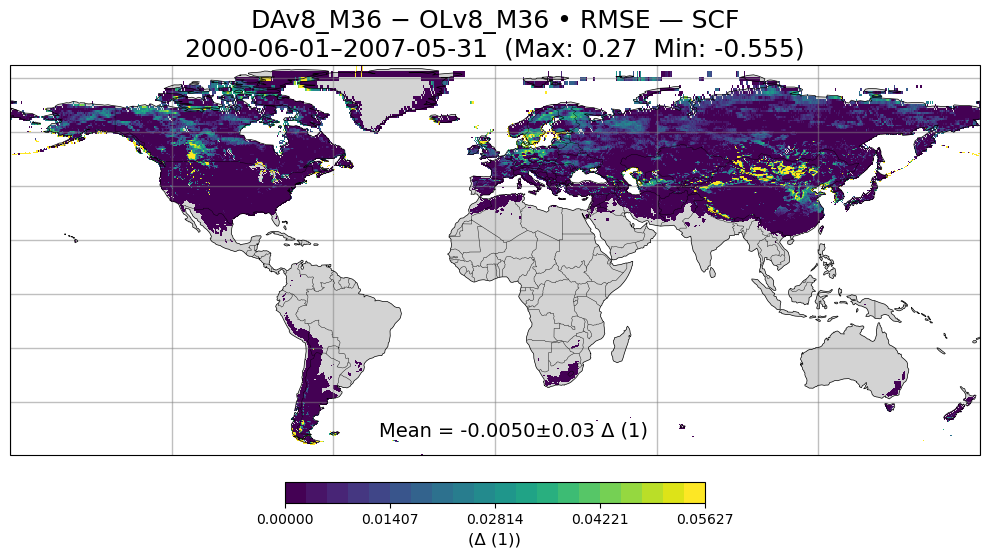

/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


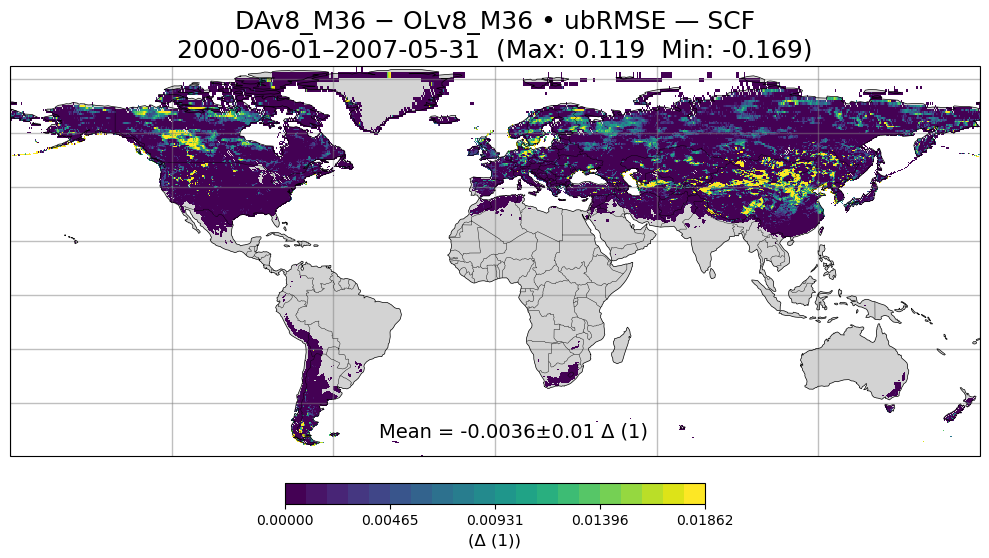

/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


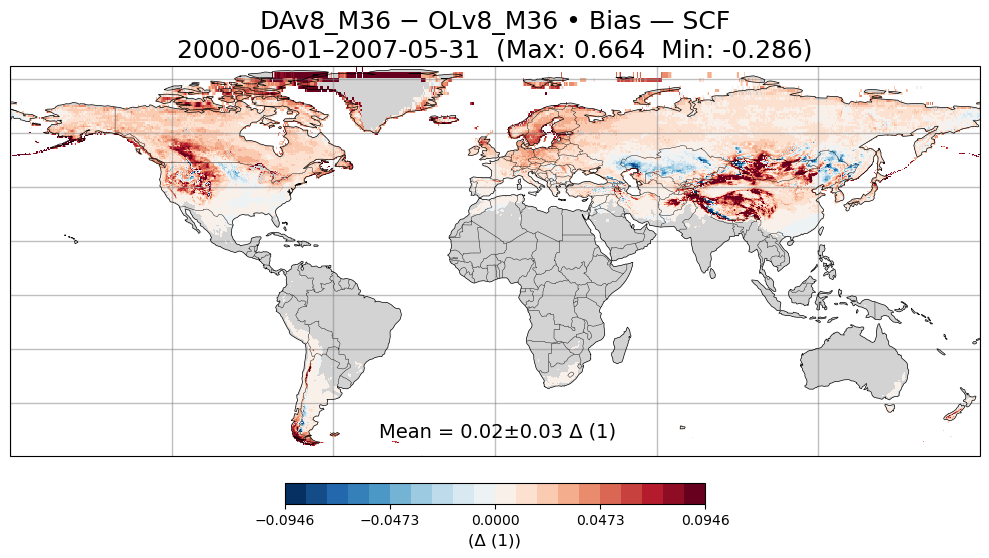

/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


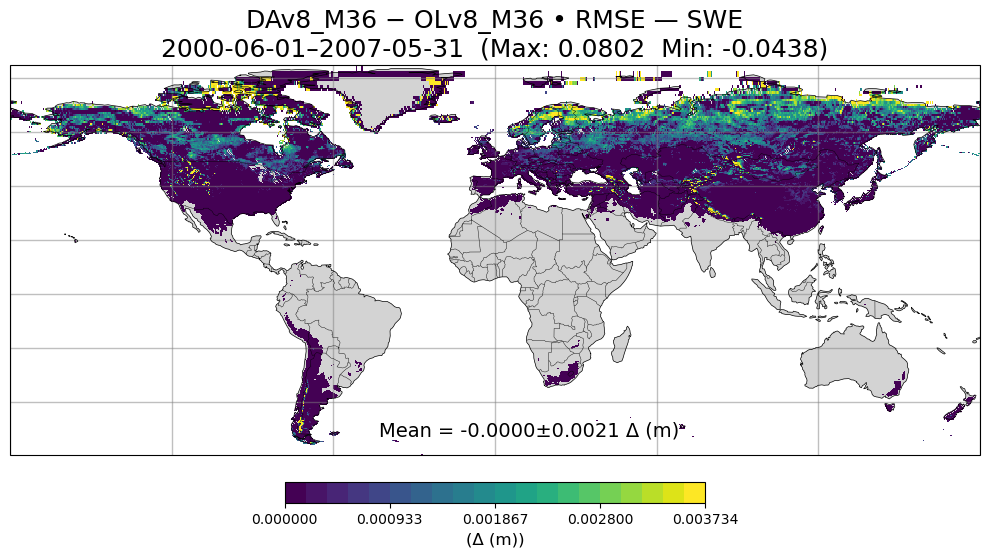

/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


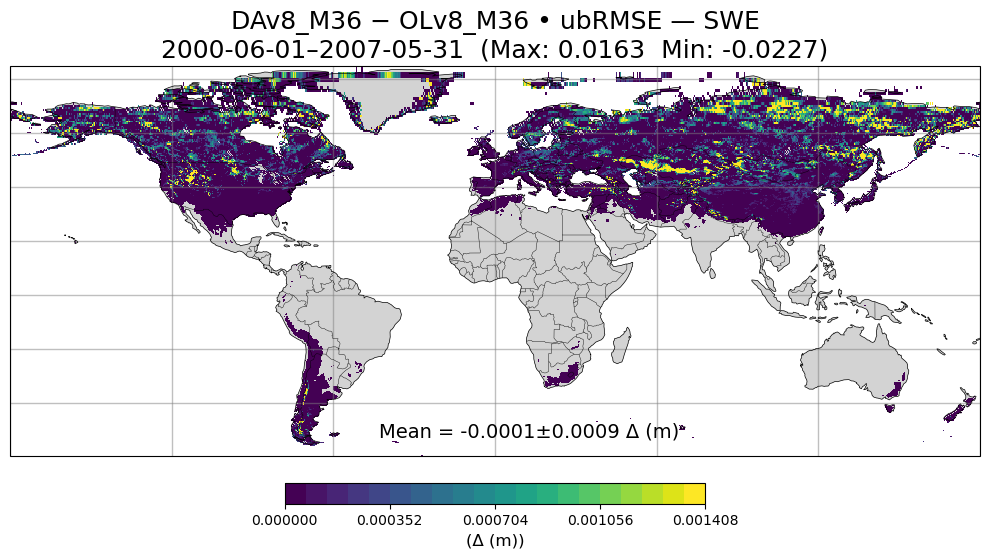

/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


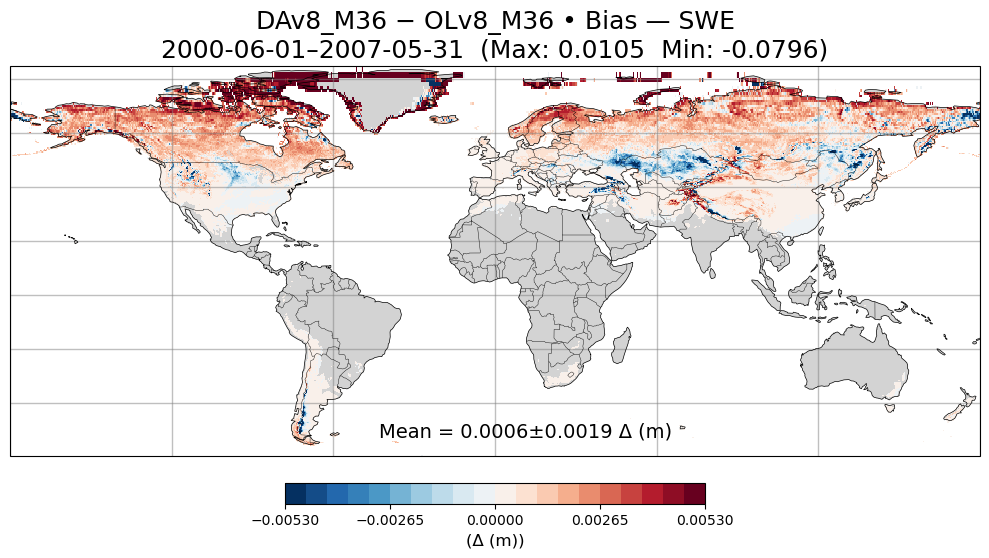

/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


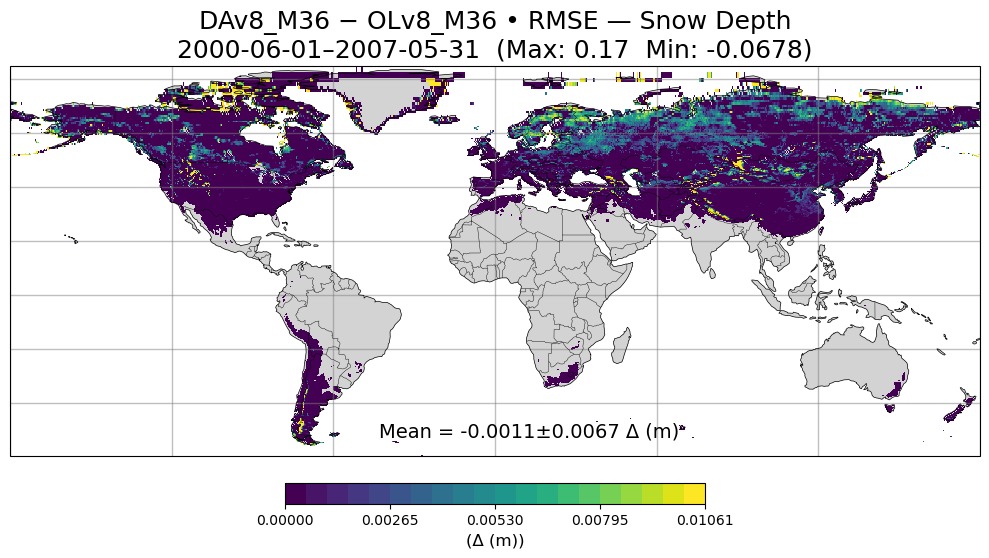

/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


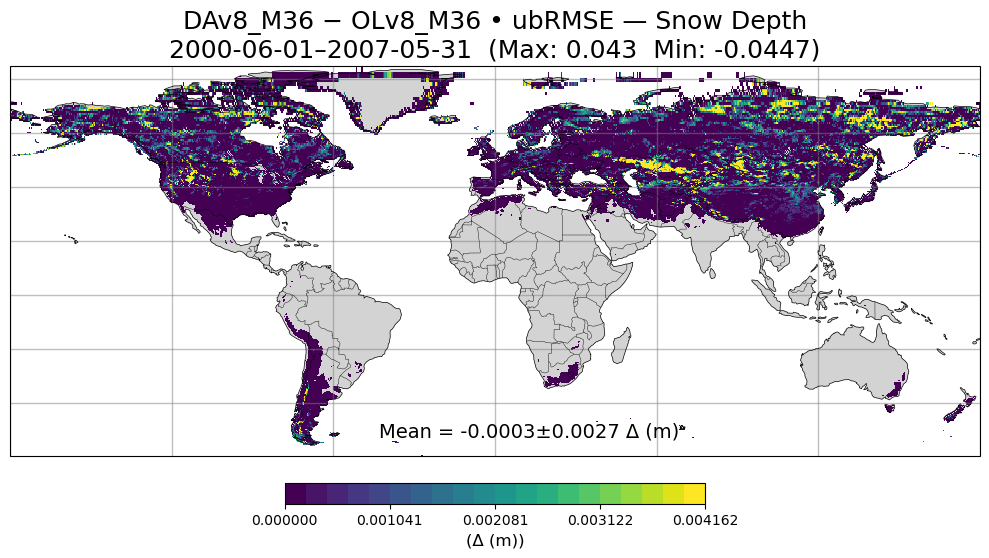

/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


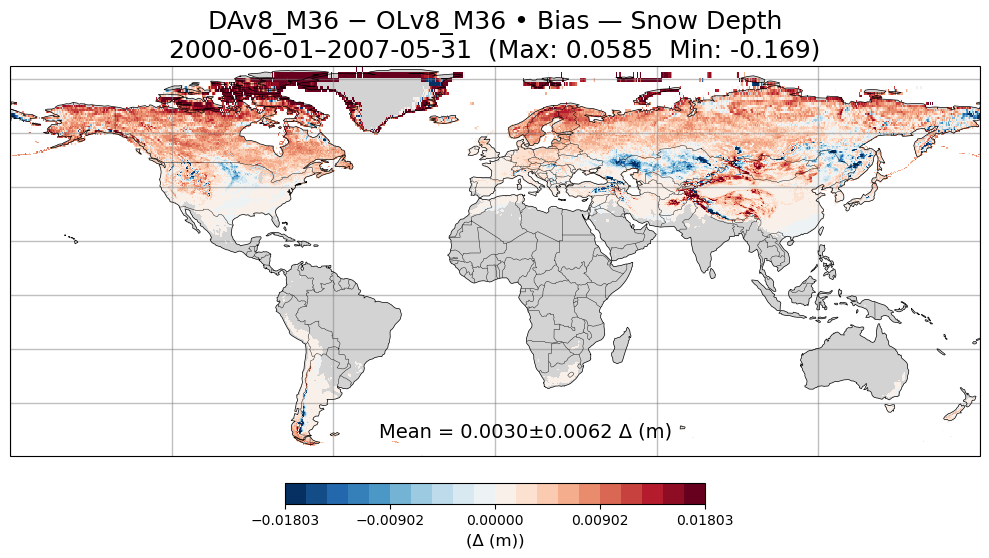

/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


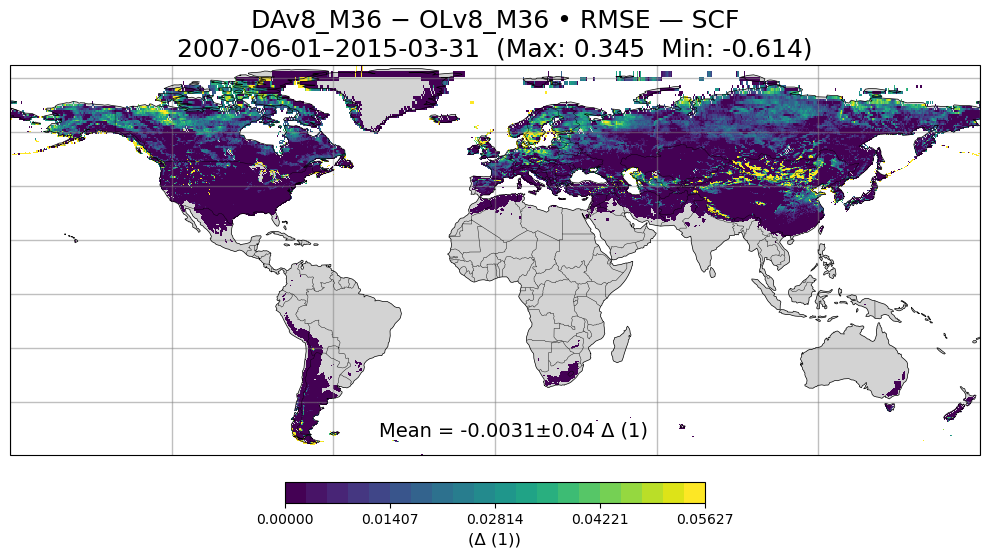

/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


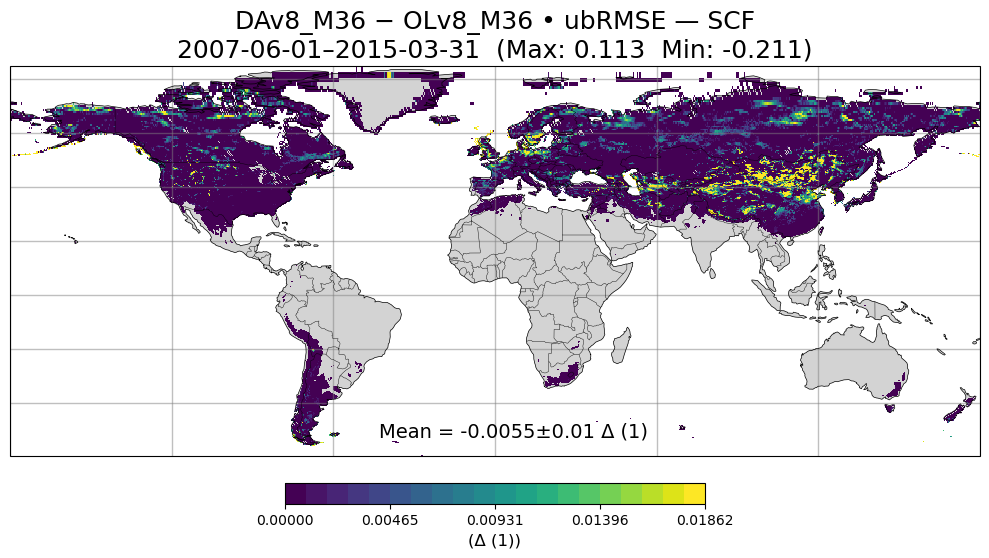

/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


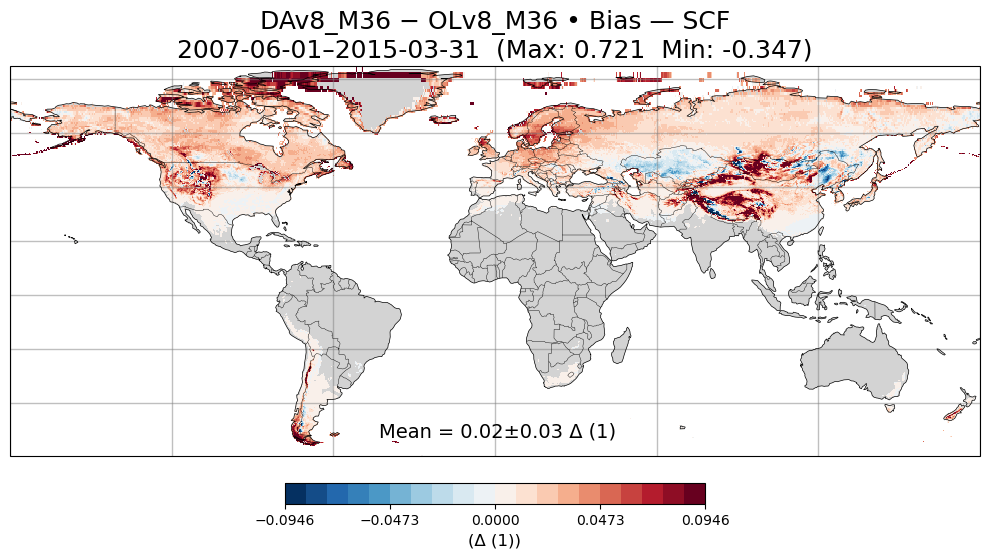

/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


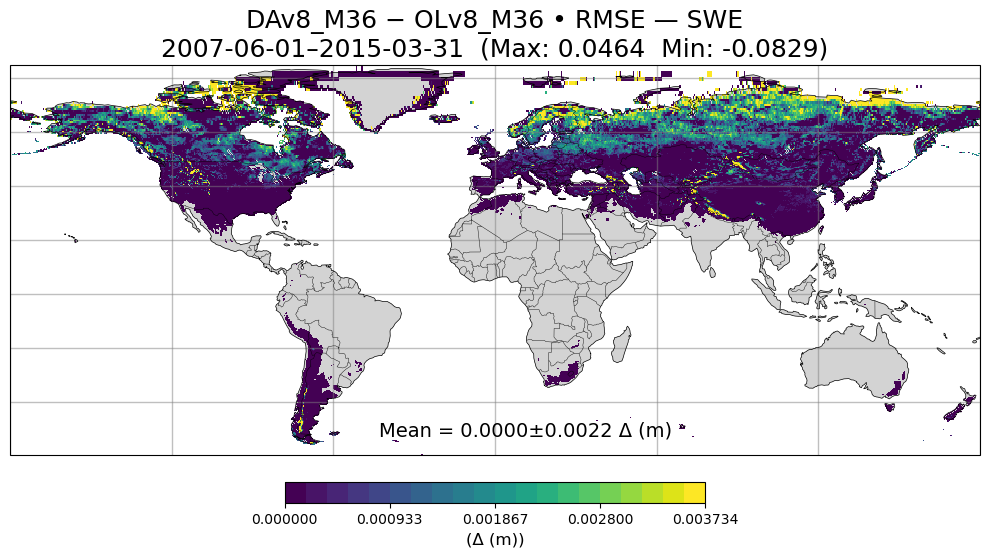

/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


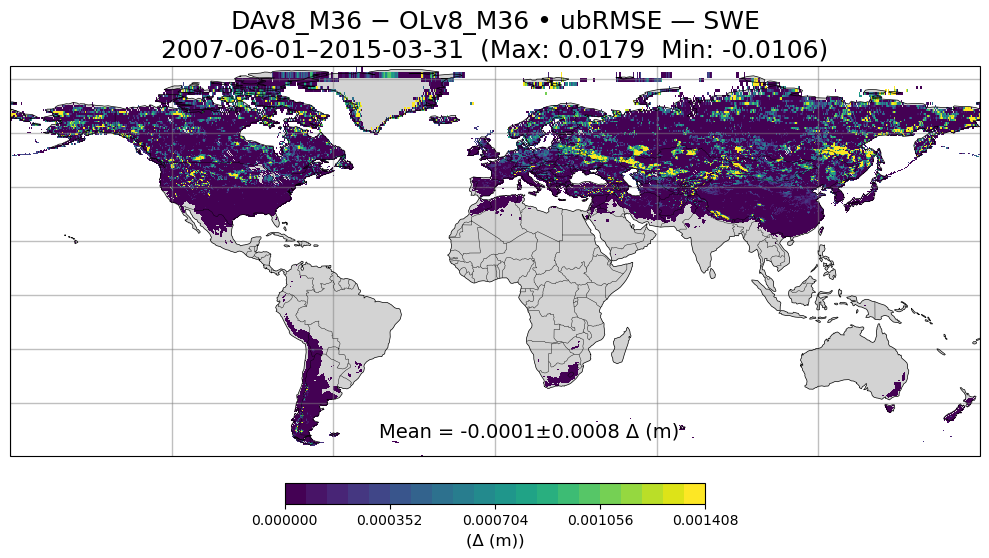

/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


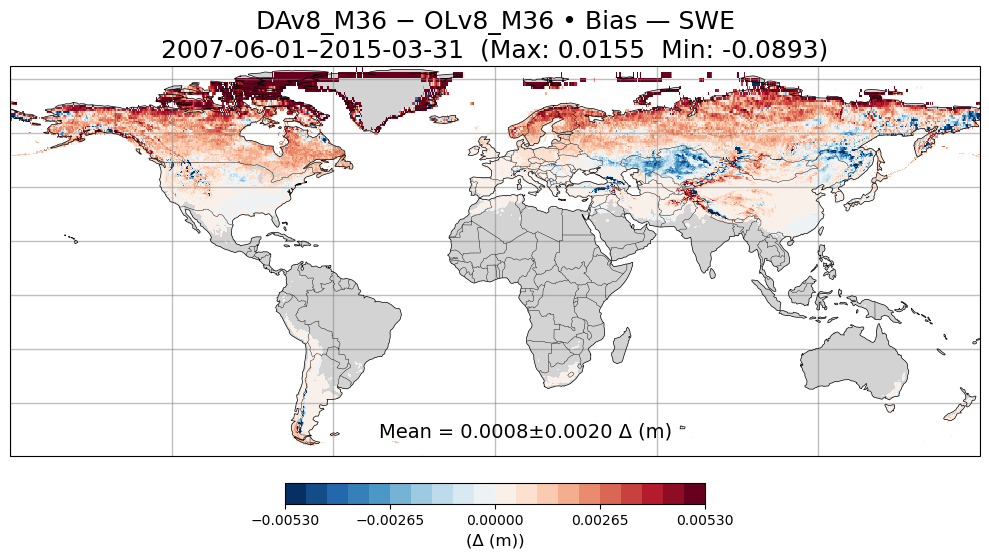

/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


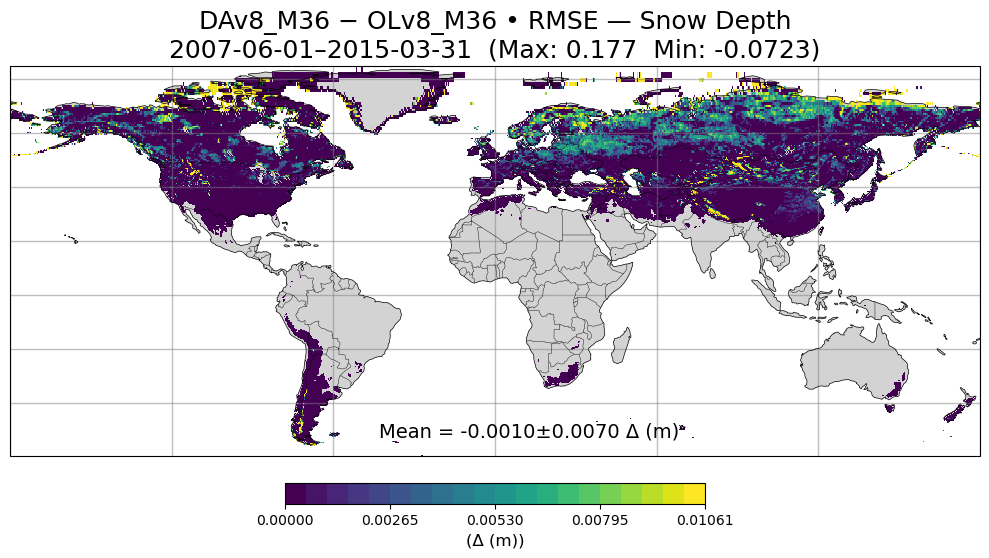

/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


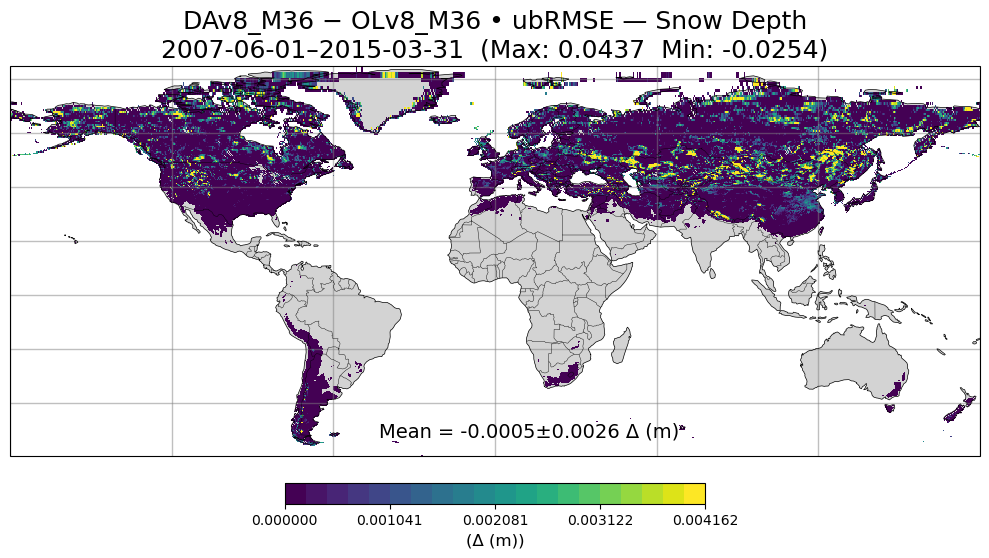

/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


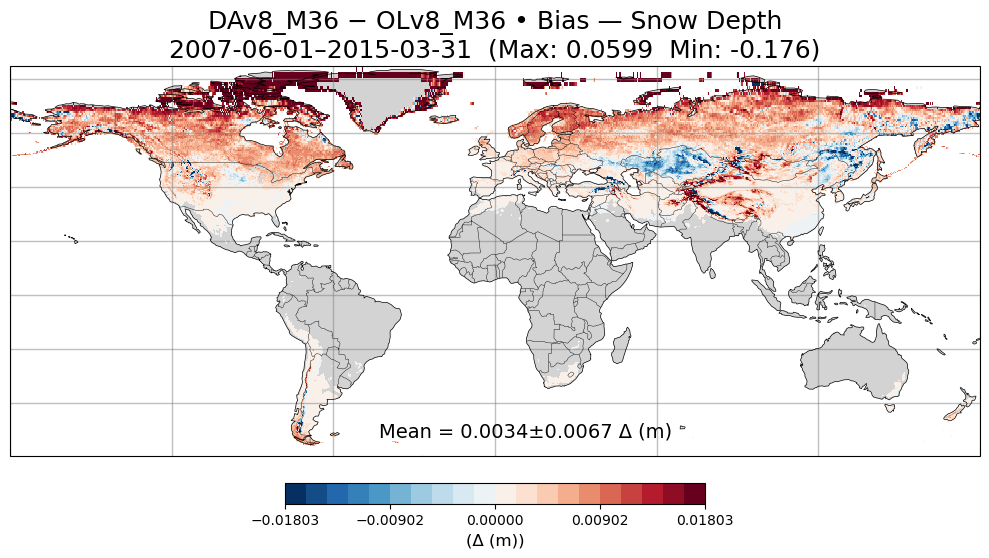

/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


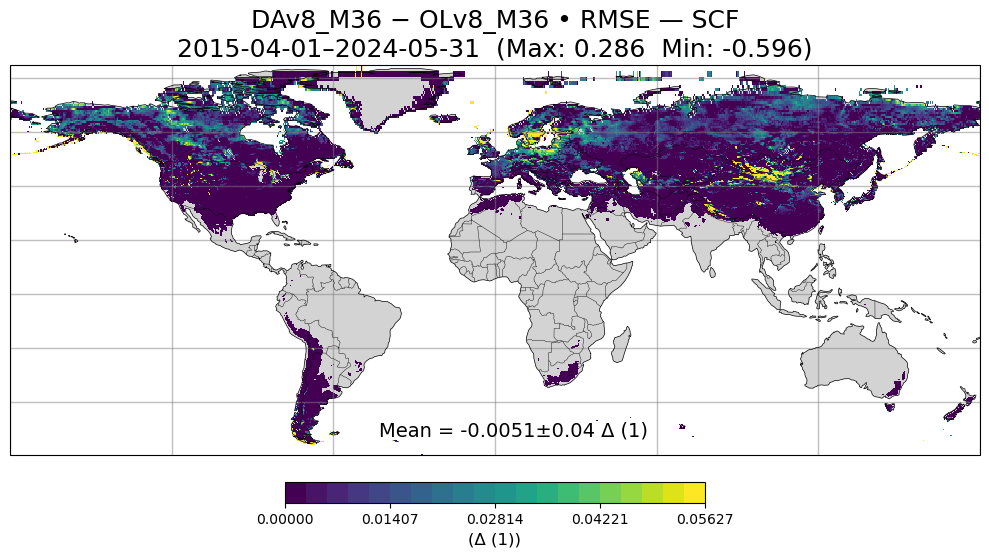

/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


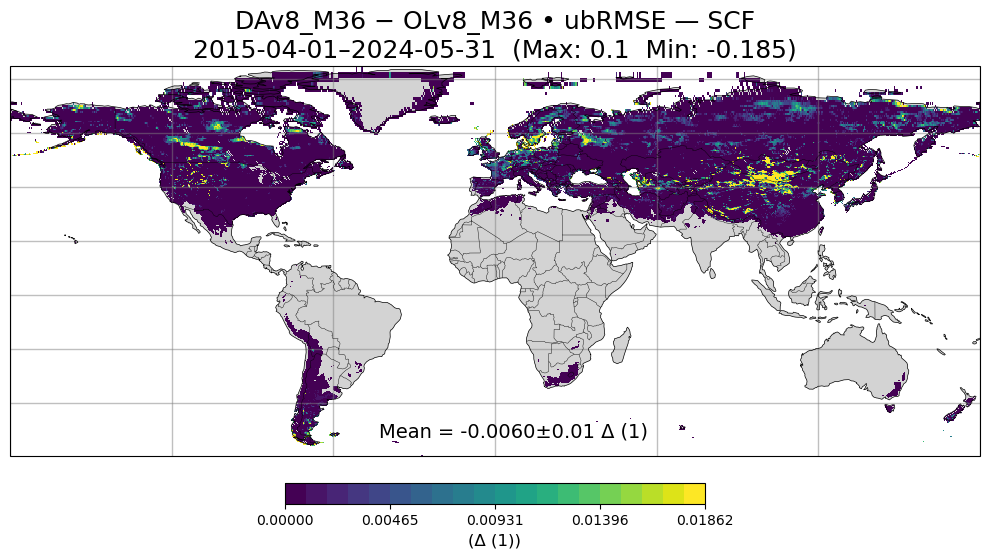

/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


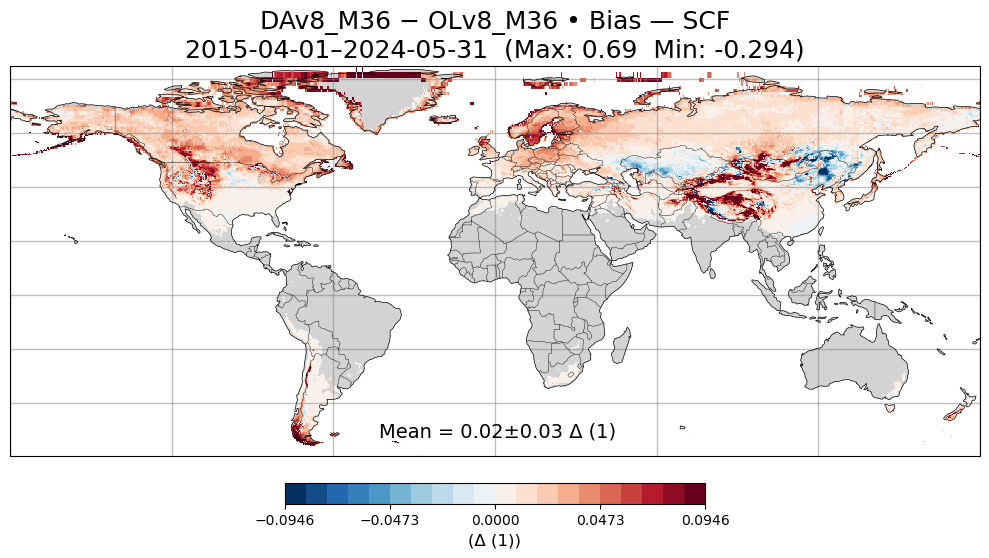

/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


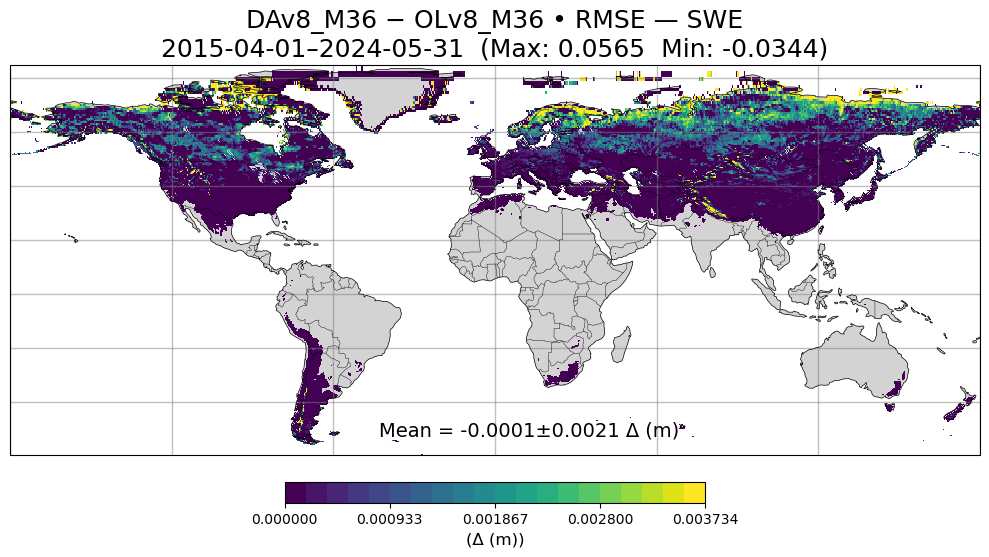

/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


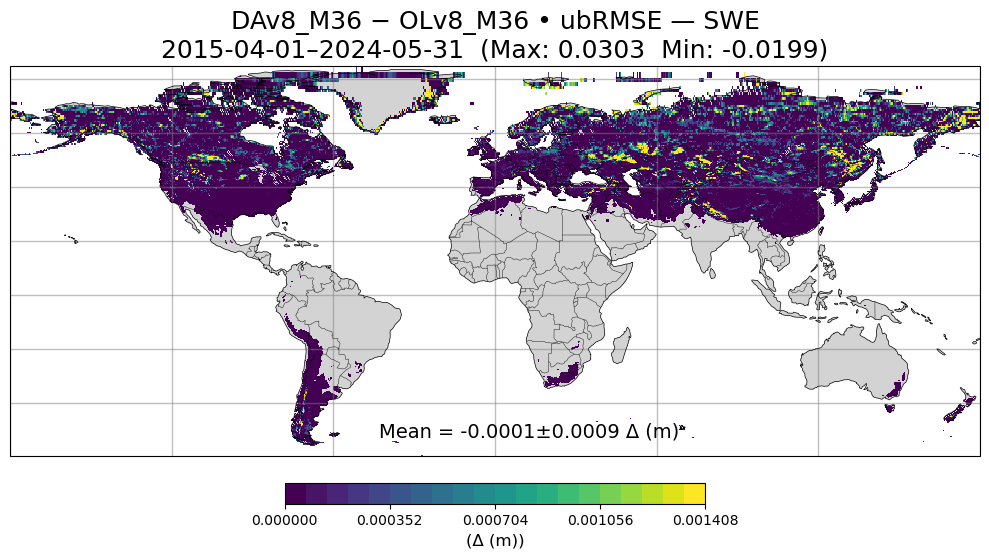

/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


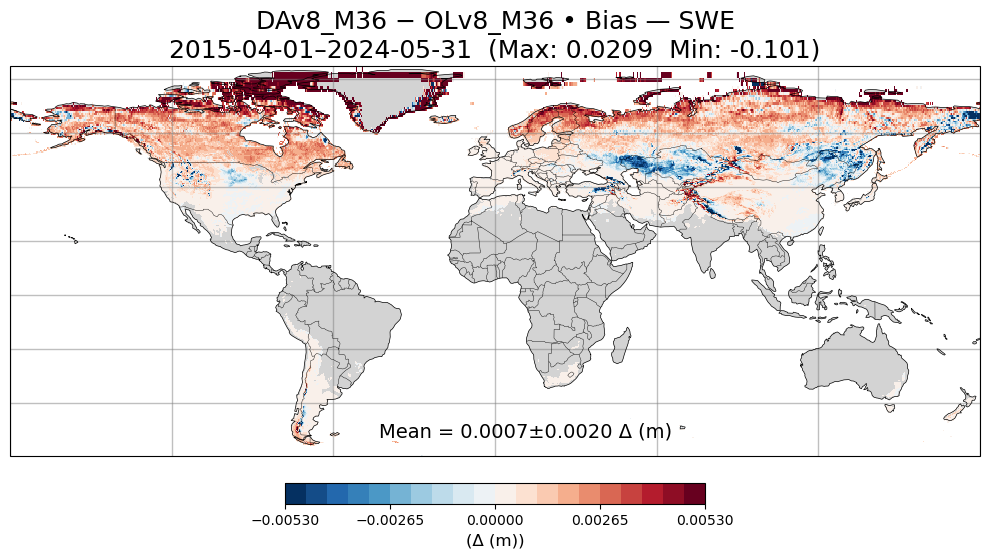

/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


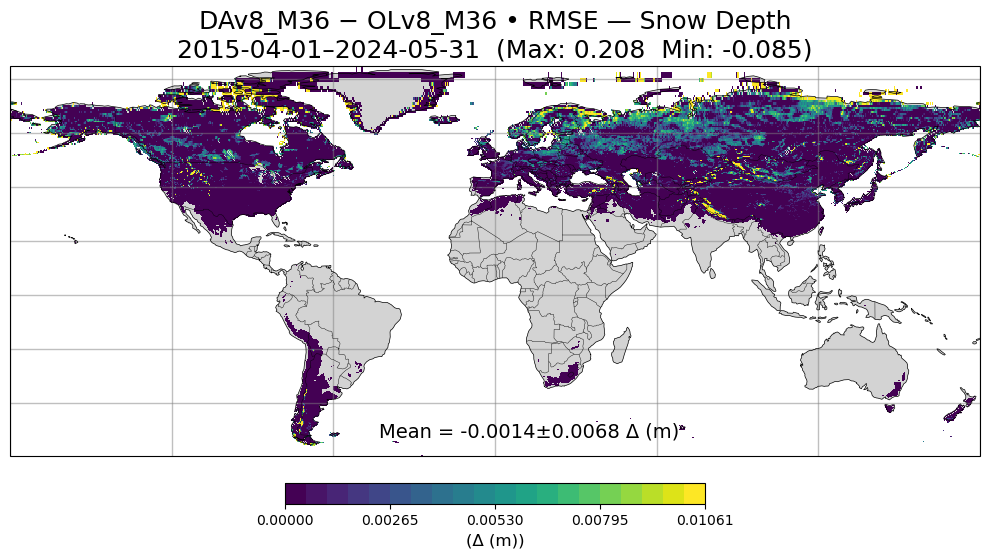

/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


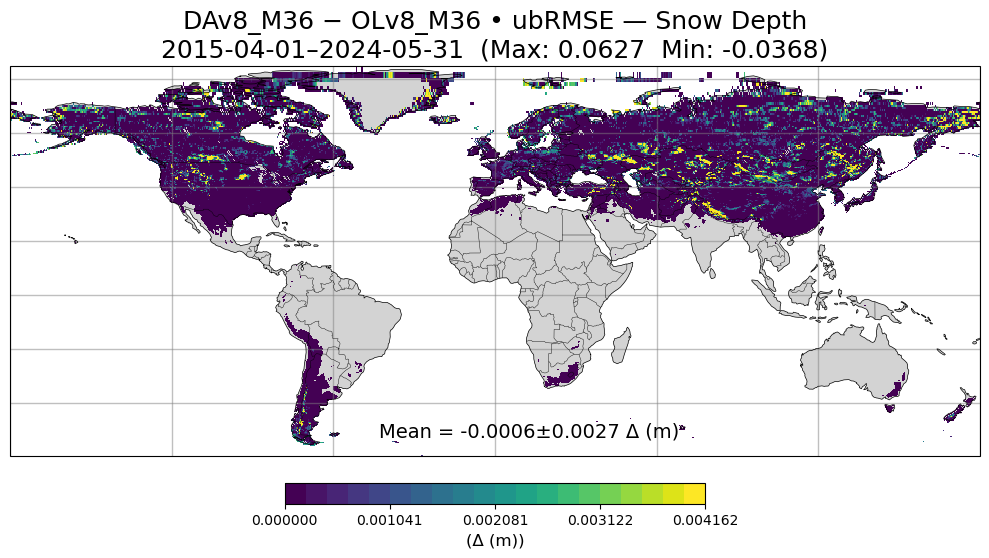

/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


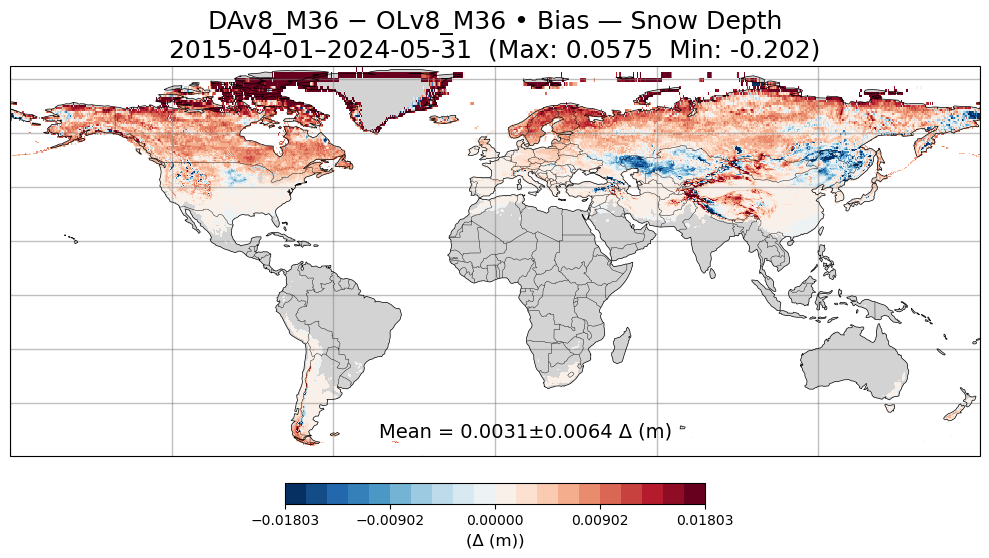

/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


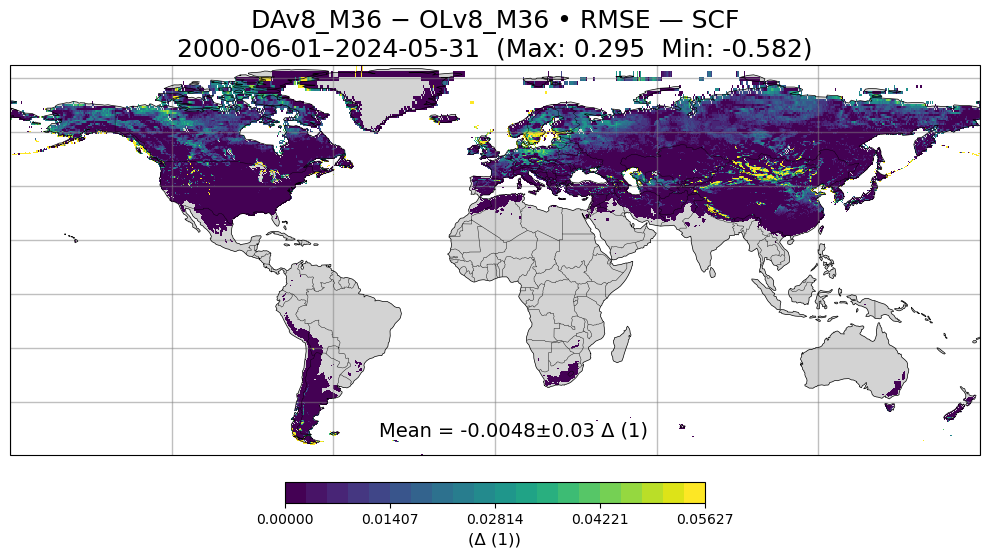

/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


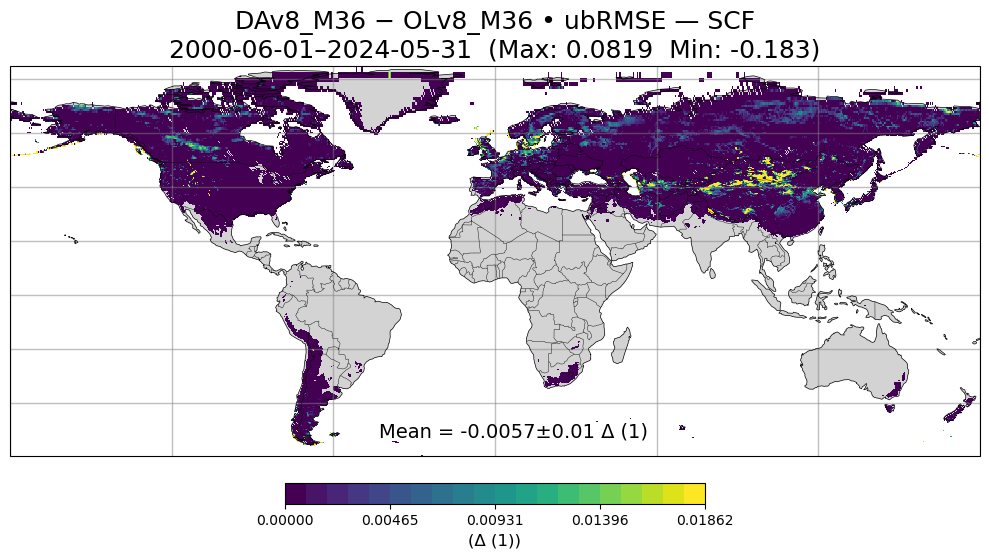

/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


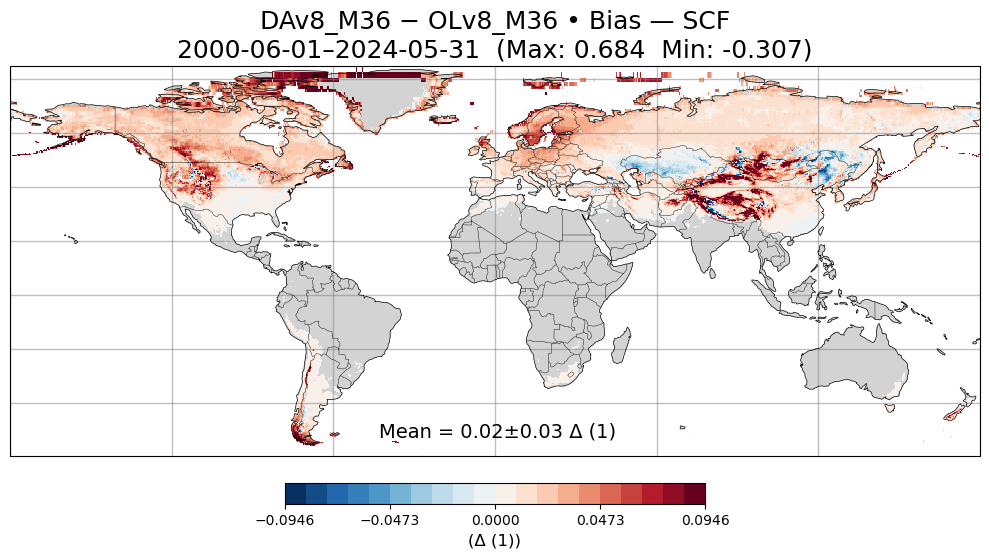

/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


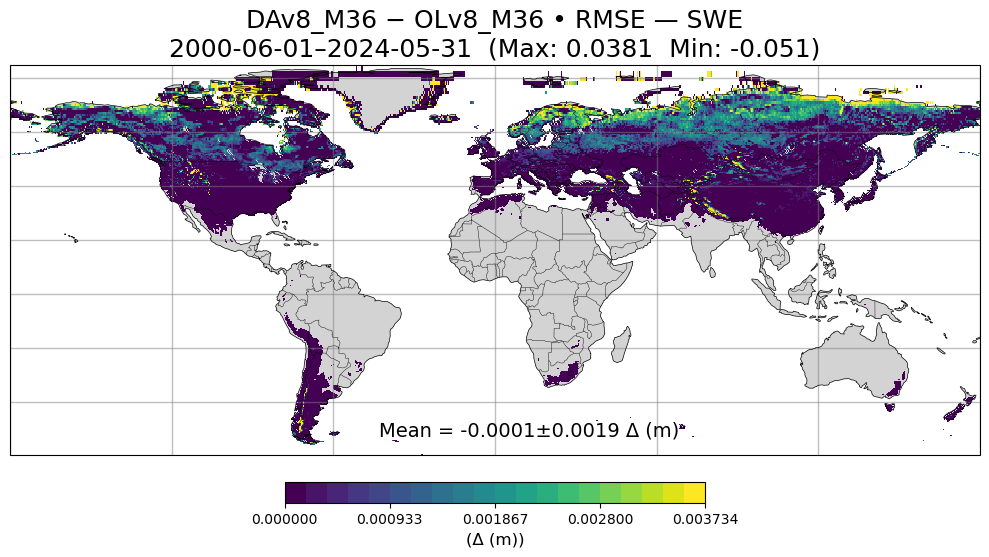

/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


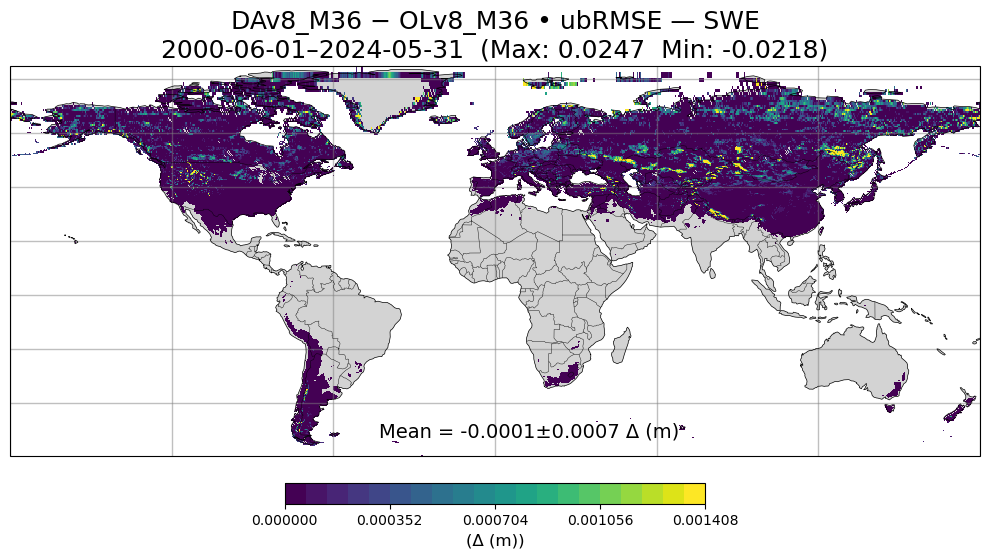

/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


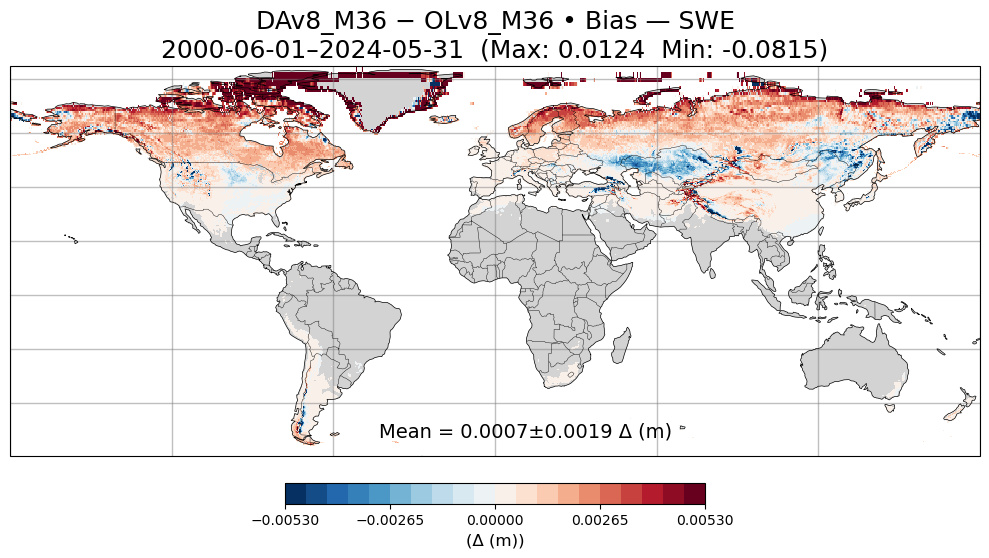

/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


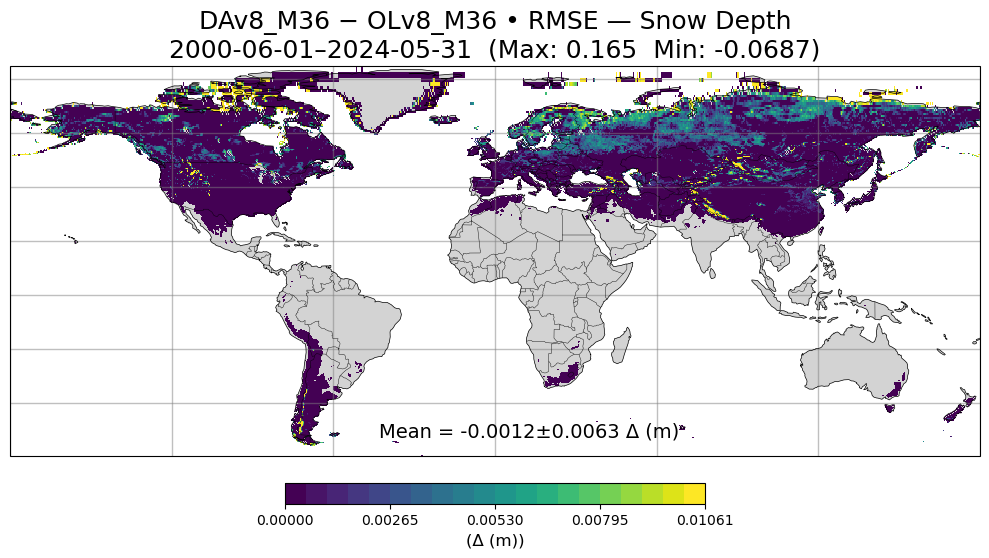

/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


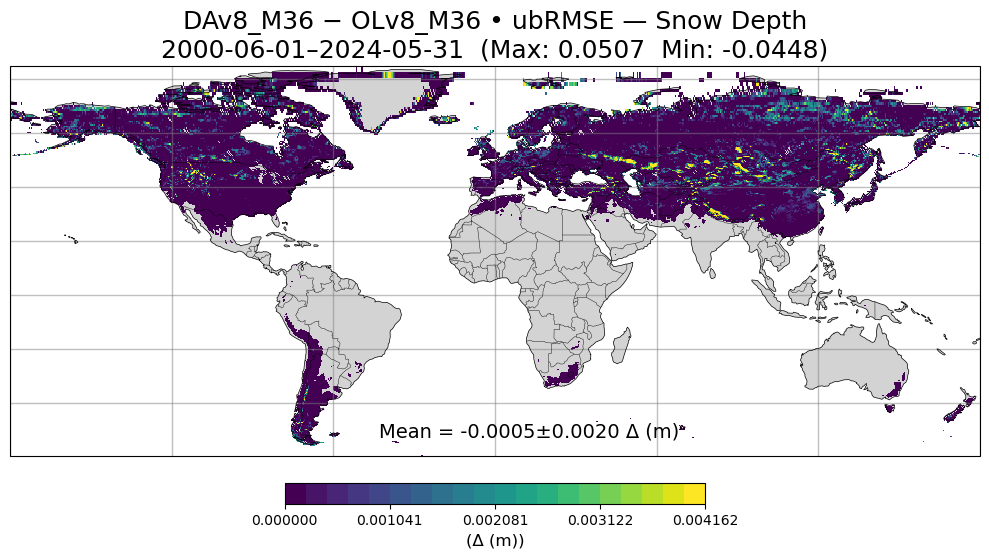

/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


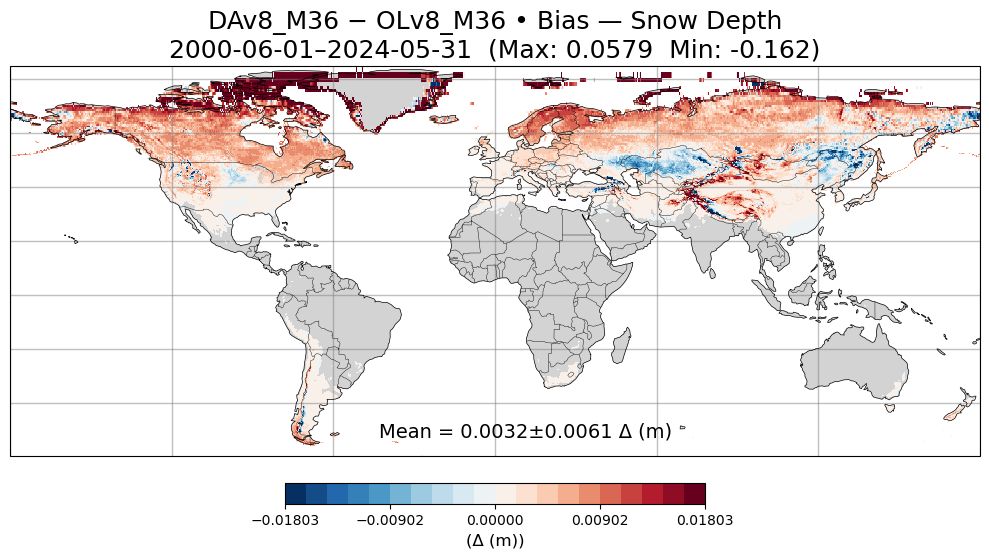

In [4]:
# --- Periodized DA−OL maps: corr fixed [-0.4,0.4] with RdBu_r; ubRMSE pooled 10/90 → symmetric, viridis ---

import numpy as np
import xarray as xr

# If diff_period isn't defined yet, build it from your 'results' dict (DA − OL per period)
if 'diff_period' not in globals():
    da_key = FN_DA
    ol_key = FN_OL
    diff_period = xr.Dataset({v: (results[da_key][v] - results[ol_key][v])
                              for v in results[da_key].data_vars})

lat2d = diff_period['lat'].values
lon2d = diff_period['lon'].values
period_labels = list(diff_period['period'].values)

metric_titles = {
    'rmse_scf':'RMSE — SCF',
    'ubRMSE_scf':'ubRMSE — SCF',
    'bias_scf':'Bias — SCF',
    'rmse_swe':'RMSE — SWE',
    'ubRMSE_swe':'ubRMSE — SWE',
    'bias_swe':'Bias — SWE',
    'rmse_snwd':'RMSE — Snow Depth',
    'ubRMSE_snwd':'ubRMSE — Snow Depth',
    'bias_snwd':'Bias — Snow Depth',
}
metric_units = {
    'rmse_scf':'Δ (1)', 'ubRMSE_scf':'Δ (1)', 'bias_scf':'Δ (1)',
    'rmse_swe':'Δ (m)', 'ubRMSE_swe':'Δ (m)', 'bias_swe':'Δ (m)',
    'rmse_snwd':'Δ (m)', 'ubRMSE_snwd':'Δ (m)', 'bias_snwd':'Δ (m)',
}

metrics = [
    'rmse_scf','ubRMSE_scf','bias_scf',
    'rmse_swe','ubRMSE_swe','bias_swe',
    'rmse_snwd','ubRMSE_snwd','bias_snwd'
]
metrics = [m for m in metrics if m in diff_period.data_vars]

def to_map_array(vals, lon2d, lat2d):
    mask = np.isfinite(vals) & np.isfinite(lon2d) & np.isfinite(lat2d)
    out = np.empty((mask.sum(), 3)); out.fill(np.nan)
    out[:, 0] = vals[mask]
    out[:, 1] = lon2d[mask]
    out[:, 2] = lat2d[mask]
    return out

# Precompute pooled limits by metric type
pooled_limits = {}
for m in metrics:
    vals = diff_period[m].values  # (period,y,x)
    finite = vals[np.isfinite(vals)]
    if finite.size == 0:
        pooled_limits[m] = (-1.0, 1.0) if m.startswith('bias') else (0.0, 1.0)
        continue

    if m.startswith('bias'):
        p2, p98 = np.nanpercentile(finite, [2, 98])
        vmax = float(max(abs(p2), abs(p98)))
        if not np.isfinite(vmax) or vmax == 0:
            vmax = float(max(abs(np.nanmin(finite)), abs(np.nanmax(finite)))) or 1.0
        pooled_limits[m] = (-vmax, +vmax)
    else:
        p98 = float(np.nanpercentile(finite, 98))
        vmax = p98 if np.isfinite(p98) and p98 > 0 else float(np.nanmax(finite))
        if not np.isfinite(vmax) or vmax <= 0:
            vmax = 1.0
        pooled_limits[m] = (0.0, vmax)

for per in period_labels:
    print(f"\n=== Period: {per} ===")
    for m in metrics:
        diff_map = diff_period[m].sel(period=per)  # 2D (y,x)
        arr = to_map_array(diff_map.values, lon2d, lat2d)

        finite_vals = arr[:, 0][np.isfinite(arr[:, 0])]
        if finite_vals.size == 0:
            print(f"{m}: no finite values; skipping.")
            continue

        # Color limits + colormap
        cmin, cmax = pooled_limits[m]
        cmap = 'RdBu_r' if m.startswith('bias') else 'viridis'

        vmax = float(np.nanmax(finite_vals))
        vmin = float(np.nanmin(finite_vals))

        fig, ax = plot_region(
            arr,
            region_bounds=REGION_BOUNDS['global'],
            meanflag=True,
            plot_title=(f"DAv8_M36 − OLv8_M36 • {metric_titles[m]}\n"
                        f"{per}  (Max: {vmax:.3g}  Min: {vmin:.3g})"),
            units=metric_units[m],
            cmin=cmin, cmax=cmax,
            cmap=cmap,              # <-- pass through to your plotter
        )
        fig.tight_layout()



In [5]:
# --- Build a tidy summary table of periodized metrics: DA, OL, and Δ = DA−OL ---

# Map filenames → short labels used in the table
label_for = {}
for fn in FILES:
    if "DA" in fn or "DAv" in fn:
        label_for[fn] = "DA"
    elif "OL" in fn or "OLv" in fn:
        label_for[fn] = "OL"
    else:
        # fallback: use stem without extension
        label_for[fn] = fn.replace(".nc","")

metrics = [
    'anomR_sfc','R_sfc','ubRMSE_sfc',
    'anomR_rz','R_rz','ubRMSE_rz',
    'anomR_scf','R_scf','ubRMSE_scf','rmse_scf','bias_scf',
    'anomR_swe','R_swe','ubRMSE_swe','rmse_swe','bias_swe',
    'anomR_snwd','R_snwd','ubRMSE_snwd','rmse_snwd','bias_snwd'
]

pretty  = {
    'anomR_sfc':'AnomCorr (Surf SM)',
    'R_sfc'    :'RawCorr (Surf SM)',
    'ubRMSE_sfc':'ubRMSE (Surf SM)',

    'anomR_rz' :'AnomCorr (RZ SM)',
    'R_rz'     :'RawCorr (RZ SM)',
    'ubRMSE_rz':'ubRMSE (RZ SM)',

    'anomR_scf':'AnomCorr (SCF)',
    'R_scf'    :'RawCorr (SCF)',
    'ubRMSE_scf':'ubRMSE (SCF)',
    'rmse_scf':'RMSE (SCF)',
    'bias_scf':'Bias (SCF)',

    'anomR_swe':'AnomCorr (SWE)',
    'R_swe'    :'RawCorr (SWE)',
    'ubRMSE_swe':'ubRMSE (SWE)',
    'rmse_swe':'RMSE (SWE)',
    'bias_swe':'Bias (SWE)',

    'anomR_snwd':'AnomCorr (Snow Depth)',
    'R_snwd'    :'RawCorr (Snow Depth)',
    'ubRMSE_snwd':'ubRMSE (Snow Depth)',
    'rmse_snwd':'RMSE (Snow Depth)',
    'bias_snwd':'Bias (Snow Depth)',
}

# Collect rows
rows = []
periods = list(next(iter(results.values())).coords['period'].values)
for per in periods:
    row = {'Period': str(per)}
    # Per-file means and valid counts
    for fn, ds_per in results.items():
        tag = label_for[fn]
        for m in metrics:
            if m in ds_per:
                da2d = ds_per[m].sel(period=per)  # (y,x)
                mean_val = float(da2d.mean(skipna=True).values)
                n_valid  = int(np.isfinite(da2d.values).sum())
                row[(tag, pretty[m])] = mean_val
                row[(tag, f"N valid ({pretty[m]})")] = n_valid
    rows.append(row)

# Build DataFrame with MultiIndex columns
df = pd.DataFrame(rows).set_index("Period")
# Ensure both DA and OL exist before computing deltas
if len(FILES) >= 2:
    # Add Δ = DA − OL columns for each metric (means only)
    for m in metrics:
        col_da = ("DA",  pretty[m])
        col_ol = ("OL",  pretty[m])
        if col_da in df.columns and col_ol in df.columns:
            df[("Δ (DA−OL)", pretty[m])] = df[col_da] - df[col_ol]

# Sort columns: DA | OL | Δ
new_cols = []
for group in ["DA", "OL", "Δ (DA−OL)"]:
    sub = [c for c in df.columns if c[0] == group and "N valid" not in c[1]]
    sub_valid = [c for c in df.columns if c[0] == group and "N valid" in c[1]]
    # keep metric order
    ordered = []
    for m in metrics:
        mean_label = pretty[m]
        n_label = f"N valid ({mean_label})"
        for c in sub:
            if c[1] == mean_label:
                ordered.append(c)
        for c in sub_valid:
            if c[1] == n_label:
                ordered.append(c)
    new_cols.extend(ordered)
df = df.reindex(columns=new_cols)

# Formatting: 3 decimals for metric means, integers for counts
fmt = {}
for c in df.columns:
    if "N valid" in c[1]:
        fmt[c] = "{:d}"
    else:
        fmt[c] = "{:.3f}"

# Display (pandas)
try:
    from IPython.display import display
    display(df.style.format(fmt).set_caption(
    "ERA5-Land vs Model: Periodized Metrics (AnomCorr, RawCorr, ubRMSE; spatial medians and valid counts)"
))
except Exception:
    print(df.to_string())

# Also save to CSV for records

df.to_csv(out_csv)
print(f"Saved summary table → {out_csv}")


/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_21324/401502541.py:76: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[("Δ (DA−OL)", pretty[m])] = df[col_da] - df[col_ol]
/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_21324/401502541.py:76: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[("Δ (DA−OL)", pretty[m])] = df[col_da] - df[col_ol]
/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_21324/401502541.py:76: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of cal

,"('DA', 'AnomCorr (Surf SM)')","('DA', 'N valid (AnomCorr (Surf SM))')","('DA', 'RawCorr (Surf SM)')","('DA', 'N valid (RawCorr (Surf SM))')","('DA', 'ubRMSE (Surf SM)')","('DA', 'N valid (ubRMSE (Surf SM))')","('DA', 'AnomCorr (RZ SM)')","('DA', 'N valid (AnomCorr (RZ SM))')","('DA', 'RawCorr (RZ SM)')","('DA', 'N valid (RawCorr (RZ SM))')","('DA', 'ubRMSE (RZ SM)')","('DA', 'N valid (ubRMSE (RZ SM))')","('DA', 'AnomCorr (SCF)')","('DA', 'N valid (AnomCorr (SCF))')","('DA', 'RawCorr (SCF)')","('DA', 'N valid (RawCorr (SCF))')","('DA', 'ubRMSE (SCF)')","('DA', 'N valid (ubRMSE (SCF))')","('DA', 'RMSE (SCF)')","('DA', 'N valid (RMSE (SCF))')","('DA', 'Bias (SCF)')","('DA', 'N valid (Bias (SCF))')","('DA', 'AnomCorr (SWE)')","('DA', 'N valid (AnomCorr (SWE))')","('DA', 'RawCorr (SWE)')","('DA', 'N valid (RawCorr (SWE))')","('DA', 'ubRMSE (SWE)')","('DA', 'N valid (ubRMSE (SWE))')","('DA', 'RMSE (SWE)')","('DA', 'N valid (RMSE (SWE))')","('DA', 'Bias (SWE)')","('DA', 'N valid (Bias (SWE))')","('DA', 'AnomCorr (Snow Depth)')","('DA', 'N valid (AnomCorr (Snow Depth))')","('DA', 'RawCorr (Snow Depth)')","('DA', 'N valid (RawCorr (Snow Depth))')","('DA', 'ubRMSE (Snow Depth)')","('DA', 'N valid (ubRMSE (Snow Depth))')","('DA', 'RMSE (Snow Depth)')","('DA', 'N valid (RMSE (Snow Depth))')","('DA', 'Bias (Snow Depth)')","('DA', 'N valid (Bias (Snow Depth))')","('OL', 'AnomCorr (Surf SM)')","('OL', 'N valid (AnomCorr (Surf SM))')","('OL', 'RawCorr (Surf SM)')","('OL', 'N valid (RawCorr (Surf SM))')","('OL', 'ubRMSE (Surf SM)')","('OL', 'N valid (ubRMSE (Surf SM))')","('OL', 'AnomCorr (RZ SM)')","('OL', 'N valid (AnomCorr (RZ SM))')","('OL', 'RawCorr (RZ SM)')","('OL', 'N valid (RawCorr (RZ SM))')","('OL', 'ubRMSE (RZ SM)')","('OL', 'N valid (ubRMSE (RZ SM))')","('OL', 'AnomCorr (SCF)')","('OL', 'N valid (AnomCorr (SCF))')","('OL', 'RawCorr (SCF)')","('OL', 'N valid (RawCorr (SCF))')","('OL', 'ubRMSE (SCF)')","('OL', 'N valid (ubRMSE (SCF))')","('OL', 'RMSE (SCF)')","('OL', 'N valid (RMSE (SCF))')","('OL', 'Bias (SCF)')","('OL', 'N valid (Bias (SCF))')","('OL', 'AnomCorr (SWE)')","('OL', 'N valid (AnomCorr (SWE))')","('OL', 'RawCorr (SWE)')","('OL', 'N valid (RawCorr (SWE))')","('OL', 'ubRMSE (SWE)')","('OL', 'N valid (ubRMSE (SWE))')","('OL', 'RMSE (SWE)')","('OL', 'N valid (RMSE (SWE))')","('OL', 'Bias (SWE)')","('OL', 'N valid (Bias (SWE))')","('OL', 'AnomCorr (Snow Depth)')","('OL', 'N valid (AnomCorr (Snow Depth))')","('OL', 'RawCorr (Snow Depth)')","('OL', 'N valid (RawCorr (Snow Depth))')","('OL', 'ubRMSE (Snow Depth)')","('OL', 'N valid (ubRMSE (Snow Depth))')","('OL', 'RMSE (Snow Depth)')","('OL', 'N valid (RMSE (Snow Depth))')","('OL', 'Bias (Snow Depth)')","('OL', 'N valid (Bias (Snow Depth))')","('Δ (DA−OL)', 'AnomCorr (Surf SM)')","('Δ (DA−OL)', 'RawCorr (Surf SM)')","('Δ (DA−OL)', 'ubRMSE (Surf SM)')","('Δ (DA−OL)', 'AnomCorr (RZ SM)')","('Δ (DA−OL)', 'RawCorr (RZ SM)')","('Δ (DA−OL)', 'ubRMSE (RZ SM)')","('Δ (DA−OL)', 'AnomCorr (SCF)')","('Δ (DA−OL)', 'RawCorr (SCF)')","('Δ (DA−OL)', 'ubRMSE (SCF)')","('Δ (DA−OL)', 'RMSE (SCF)')","('Δ (DA−OL)', 'Bias (SCF)')","('Δ (DA−OL)', 'AnomCorr (SWE)')","('Δ (DA−OL)', 'RawCorr (SWE)')","('Δ (DA−OL)', 'ubRMSE (SWE)')","('Δ (DA−OL)', 'RMSE (SWE)')","('Δ (DA−OL)', 'Bias (SWE)')","('Δ (DA−OL)', 'AnomCorr (Snow Depth)')","('Δ (DA−OL)', 'RawCorr (Snow Depth)')","('Δ (DA−OL)', 'ubRMSE (Snow Depth)')","('Δ (DA−OL)', 'RMSE (Snow Depth)')","('Δ (DA−OL)', 'Bias (Snow Depth)')"
Period,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-06-01–2007-05-31,0.613,89225,0.691,89225,0.021,89225,0.523,84561,0.648,84561,0.019,84561,0.536,55569,0.807,55569,0.090,57830,0.168,57830,0.000,57830,0.584,55770,0.775,55770,0.012,57830,0.170,57830,-0.140,57830,0.582,55770,0.769,55770,0.049,57830,0.623,57830,-0.548,57830,0.615,92272,0.688,92272,0.021,92272,0.526,87449,0.649,87449,0.018,87449,0.527,55315,0.789,55315,0.094,57405,0.175,57405,-0.017,57405,0.577,

Saved summary table → ERA5_periodized_metrics_summary.csv


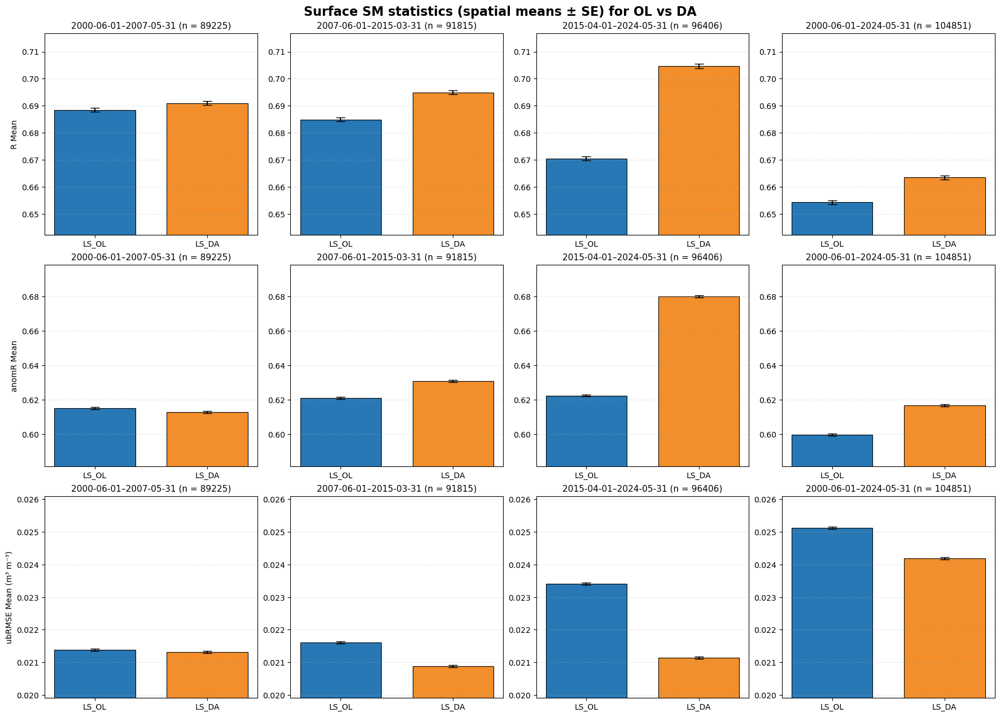

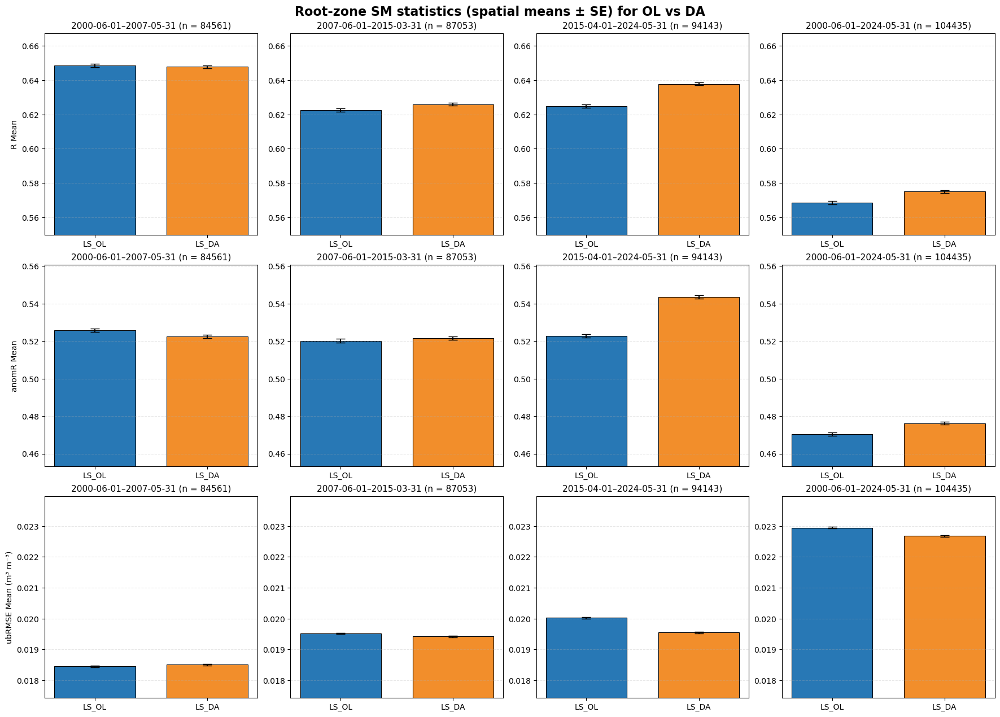

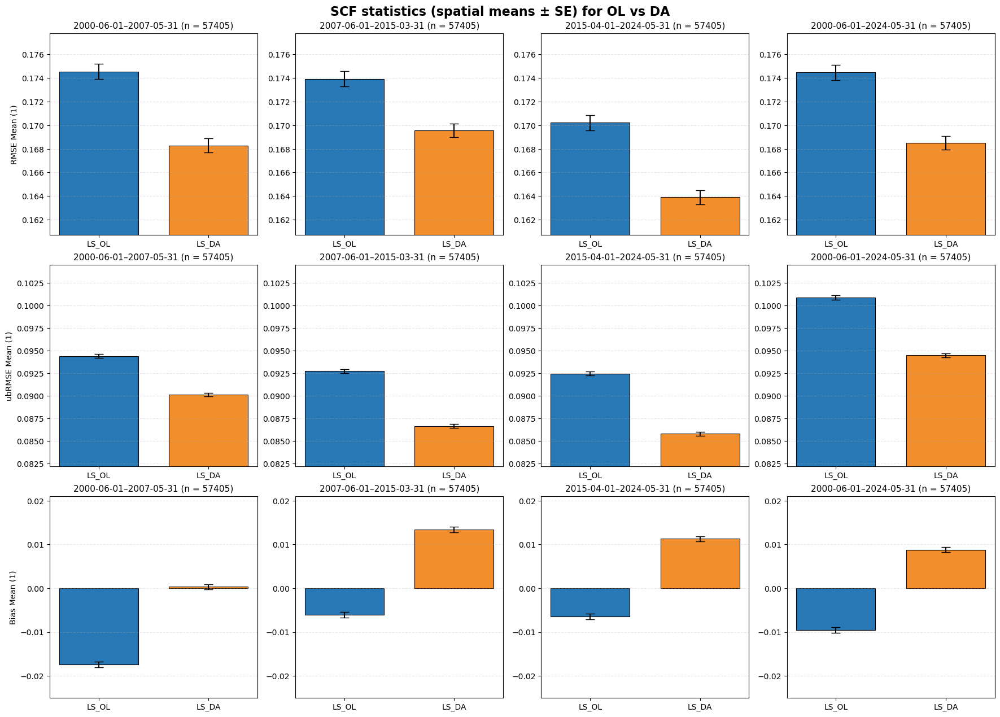

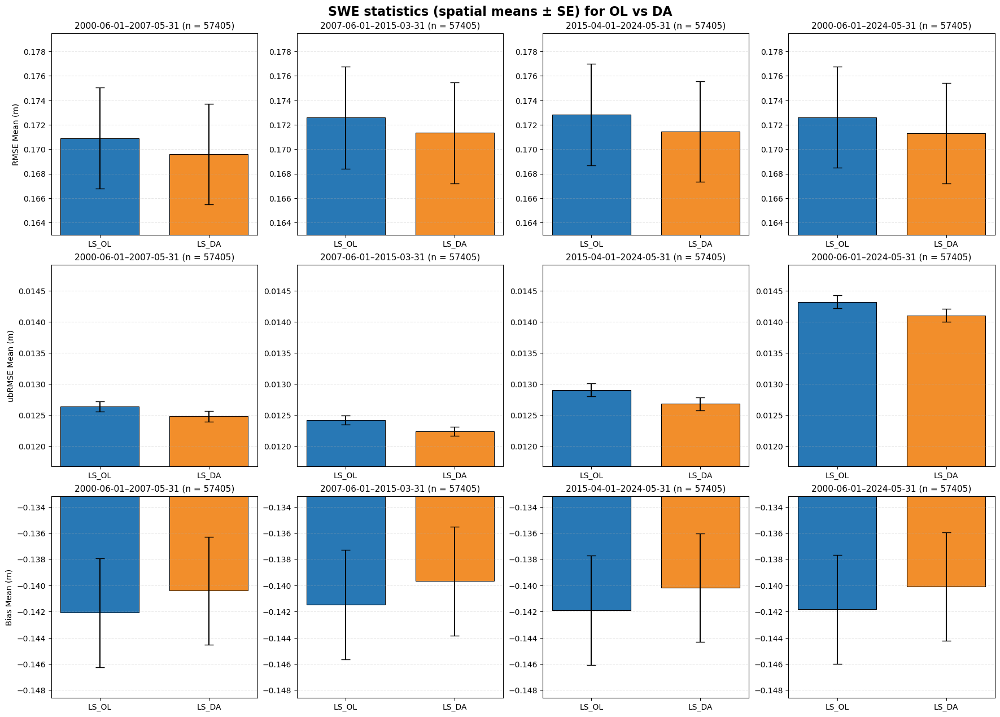

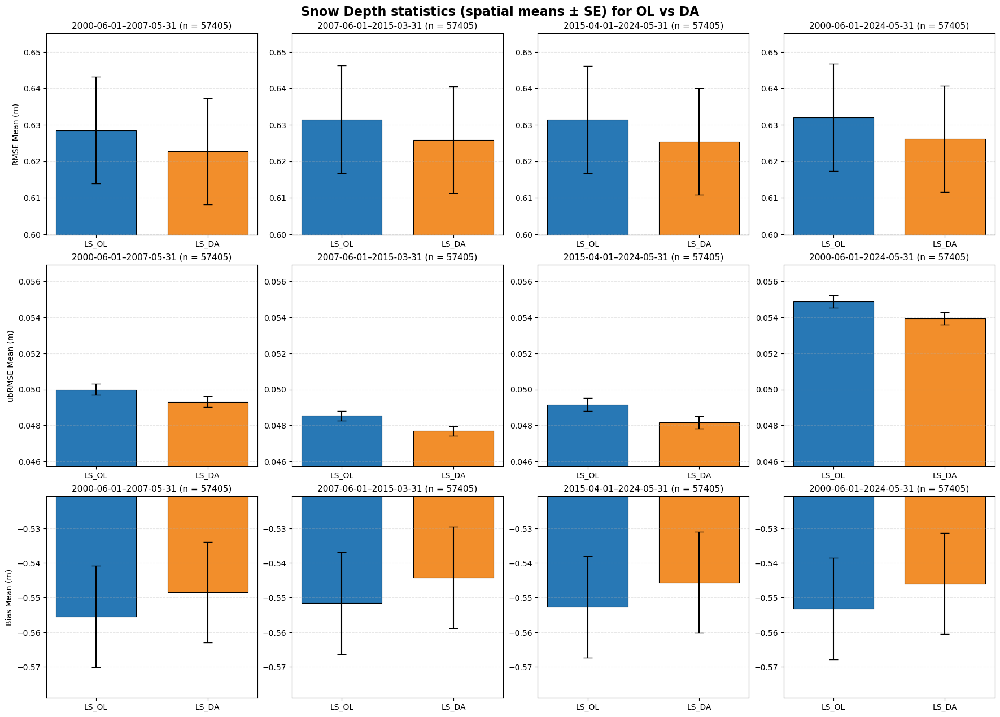

In [6]:
# --- OL vs DA bar charts for Surface SM, Root-zone SM, and SCF ---
# Uses `results` (periodized datasets) and `FILES` from earlier cells.

import numpy as np
import matplotlib.pyplot as plt

# Map filenames → labels
label_for = {}
for fn in FILES:
    if "DA" in fn or "DAv" in fn:
        label_for[fn] = "DA"
    elif "OL" in fn or "OLv" in fn:
        label_for[fn] = "OL"
    else:
        label_for[fn] = fn.replace(".nc","")

period_labels = list(next(iter(results.values())).coords["period"].values)

# Colors
COL_OL = "#2878B5"   # blue
COL_DA = "#F28E2B"   # orange

def mean_se_2d(da2d):
    """NaN-safe spatial mean & standard error across y,x + N."""
    v = np.asarray(da2d.values)
    mask = np.isfinite(v)
    n = int(mask.sum())
    if n == 0:
        return np.nan, np.nan, 0
    vals = v[mask]
    mean = float(np.nanmean(vals))
    se   = float(np.nanstd(vals, ddof=1) / np.sqrt(n)) if n > 1 else np.nan
    return mean, se, n

def pooled_ylim(means_errs, pad=0.18, hard=(None, None)):
    """
    Compute common y-lims from all (mean, err) pairs across periods/tags,
    then add generous padding. `hard` can clamp (min,max) if desired.
    """
    lows  = []
    highs = []
    for (mean, err) in means_errs:
        m = mean
        e = 0.0 if not np.isfinite(err) else err
        if np.isfinite(m):
            lows.append(m - e)
            highs.append(m + e)
    if not lows:
        return (0.0, 1.0)
    lo = np.nanmin(lows)
    hi = np.nanmax(highs)
    if hard[0] is not None: lo = max(lo, hard[0])
    if hard[1] is not None: hi = min(hi, hard[1])
    if not np.isfinite(lo) or not np.isfinite(hi) or lo == hi:
        lo, hi = 0.0, 1.0
    span = hi - lo
    pad_abs = pad * (span if span > 0 else 1.0)
    return (lo - pad_abs, hi + pad_abs)

def collect_stats(ds_per_all, metric_key):
    """Return dict: per period → {'OL': (mean,se,n), 'DA': (mean,se,n)}."""
    stats = {str(per): {} for per in period_labels}
    for fn, ds_all in ds_per_all.items():
        tag = label_for[fn]  # "OL" or "DA"
        if metric_key not in ds_all.data_vars:
            for per in stats: stats[per][tag] = (np.nan, np.nan, 0)
            continue
        for per in period_labels:
            da2d = ds_all[metric_key].sel(period=per)
            stats[str(per)][tag] = mean_se_2d(da2d)
    return stats

def plot_group(group_name, metrics, ylabels, hard_corr_bounds=None):
    """
    group_name: title string
    metrics   : list of metric variable names (length 3)
    ylabels   : list of y-axis labels for rows (length 3)
    hard_corr_bounds: (min,max) to clamp corr axes, e.g. (0.5, 0.75) or None
    """
    nrows = 3
    ncols = len(period_labels)
    fig, axes = plt.subplots(nrows, ncols, figsize=(4.4*ncols, 4.1*nrows), constrained_layout=True)
    if nrows == 1:
        axes = np.array([axes])

    fig.suptitle(f"{group_name} statistics (spatial means ± SE) for OL vs DA",
                 fontsize=16, weight="bold", y=1.02)

    # Pre-compute common y-lims per row across all periods
    common_lims = []
    for r, mkey in enumerate(metrics):
        S = collect_stats(results, mkey)
        # gather all mean±err across periods & tags
        all_me = []
        for per in period_labels:
            for tag in ("OL", "DA"):
                mean, se, _ = S[str(per)][tag]
                all_me.append((mean, se))
        # clamp correlations between [0,1] or given bounds if applicable
        if mkey.startswith(("R_", "anomR_")):
            hard = hard_corr_bounds if hard_corr_bounds is not None else (0.0, 1.0)
        else:
            hard = (None, None)
        common_lims.append(pooled_ylim(all_me, pad=0.22, hard=hard))

    # Now plot using the pre-computed y-lims
    for r, (mkey, ylabel) in enumerate(zip(metrics, ylabels)):
        S = collect_stats(results, mkey)
        for c, per in enumerate(period_labels):
            ax = axes[r, c]
            ol_mean, ol_se, ol_n = S[str(per)]["OL"]
            da_mean, da_se, da_n = S[str(per)]["DA"]

            means = [ol_mean, da_mean]
            errs  = [ol_se, da_se]
            ns    = [ol_n, da_n]

            x = np.arange(2)
            ax.bar(x, means, width=0.72,
                   color=[COL_OL, COL_DA], edgecolor="black", linewidth=0.8,
                   yerr=errs, capsize=6)

            ax.set_xticks(x)
            ax.set_xticklabels(["LS_OL", "LS_DA"])
            ax.set_ylim(*common_lims[r])
            ax.grid(axis="y", alpha=0.3, linestyle="--")

            # Titles: show period + n=min(OL,DA)
            ax.set_title(f"{per} (n = {min(ns)})", fontsize=11)

            # y-label on first column only
            if c == 0:
                ax.set_ylabel(ylabel)

    # Optional save
    # fig.savefig(f"bars_{group_name.replace(' ','_').lower()}.png", dpi=200, bbox_inches="tight")
    plt.show()

# ---- Make the three figures ----
# Surface SM
plot_group(
    group_name="Surface SM",
    metrics = ["R_sfc", "anomR_sfc", "ubRMSE_sfc"],
    ylabels = ["R Mean", "anomR Mean", "ubRMSE Mean (m³ m⁻³)"],
    hard_corr_bounds=(0.0, 1.0)  # keep correlations within 0..1; change if you prefer
)

# Root-zone SM
plot_group(
    group_name="Root-zone SM",
    metrics = ["R_rz", "anomR_rz", "ubRMSE_rz"],
    ylabels = ["R Mean", "anomR Mean", "ubRMSE Mean (m³ m⁻³)"],
    hard_corr_bounds=(0.0, 1.0)
)

# Snow Cover Fraction
plot_group(
    group_name="SCF",
    metrics = ["rmse_scf", "ubRMSE_scf", "bias_scf"],
    ylabels = ["RMSE Mean (1)", "ubRMSE Mean (1)", "Bias Mean (1)"],
    hard_corr_bounds=None
)


# Snow Water Equivalent
plot_group(
    group_name="SWE",
    metrics = ["rmse_swe", "ubRMSE_swe", "bias_swe"],
    ylabels = ["RMSE Mean (m)", "ubRMSE Mean (m)", "Bias Mean (m)"],
    hard_corr_bounds=None
)

# Snow Depth
plot_group(
    group_name="Snow Depth",
    metrics = ["rmse_snwd", "ubRMSE_snwd", "bias_snwd"],
    ylabels = ["RMSE Mean (m)", "ubRMSE Mean (m)", "Bias Mean (m)"],
    hard_corr_bounds=None
)


In [7]:
# --- ERA5-Land vs ERA5 bar charts (OL/DA) using summary CSVs ---
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import ast

csv_land = "ERA5_Land_periodized_metrics_summary.csv"
csv_era5 = "ERA5_periodized_metrics_summary.csv"

def load_summary_csv(path):
    # Read without forcing MultiIndex; infer from content
    df = pd.read_csv(path)
    if "Period" in df.columns:
        df = df.set_index("Period")

    # If columns are tuple-like strings, parse safely; tolerate pandas suffixes like '.1'
    if all(isinstance(c, str) and c.startswith("(") for c in df.columns):
        parsed = []
        for c in df.columns:
            c0 = c
            try:
                parsed.append(ast.literal_eval(c0))
                continue
            except Exception:
                pass

            # remove trailing .<int> added by pandas for duplicate names
            if isinstance(c0, str) and ")\." in c0:
                base, suf = c0.rsplit(".", 1)
                if suf.isdigit():
                    try:
                        parsed.append(ast.literal_eval(base))
                        continue
                    except Exception:
                        pass

            # fallback: keep as a generic single-level tuple
            parsed.append((str(c0), ""))

        df.columns = pd.MultiIndex.from_tuples(parsed)
    return df

df_land = load_summary_csv(csv_land)
df_era5 = load_summary_csv(csv_era5)

# align periods
common_periods = [p for p in df_land.index if p in df_era5.index]
if not common_periods:
    raise RuntimeError("No overlapping periods between ERA5-Land and ERA5 summaries.")

df_land = df_land.loc[common_periods]
df_era5 = df_era5.loc[common_periods]

pretty = {
    'anomR_sfc':'AnomCorr (Surf SM)',
    'R_sfc'    :'RawCorr (Surf SM)',
    'ubRMSE_sfc':'ubRMSE (Surf SM)',

    'anomR_rz' :'AnomCorr (RZ SM)',
    'R_rz'     :'RawCorr (RZ SM)',
    'ubRMSE_rz':'ubRMSE (RZ SM)',

    'anomR_scf':'AnomCorr (SCF)',
    'R_scf'    :'RawCorr (SCF)',
    'ubRMSE_scf':'ubRMSE (SCF)',

    'anomR_swe':'AnomCorr (SWE)',
    'R_swe'    :'RawCorr (SWE)',
    'ubRMSE_swe':'ubRMSE (SWE)',

    'anomR_snwd':'AnomCorr (Snow Depth)',
    'R_snwd'    :'RawCorr (Snow Depth)',
    'ubRMSE_snwd':'ubRMSE (Snow Depth)',

    'rmse_scf':'RMSE (SCF)',
    'bias_scf':'Bias (SCF)',
    'rmse_swe':'RMSE (SWE)',
    'bias_swe':'Bias (SWE)',
    'rmse_snwd':'RMSE (Snow Depth)',
    'bias_snwd':'Bias (Snow Depth)',
}

def get_val(df, tag, metric_label):
    col = (tag, metric_label)
    if col not in df.columns:
        return pd.Series(np.nan, index=df.index)
    return pd.to_numeric(df[col], errors="coerce")

def get_n(df, tag, metric_label):
    col = (tag, f"N valid ({metric_label})")
    if col not in df.columns:
        return pd.Series(0, index=df.index)
    return pd.to_numeric(df[col], errors="coerce")

# Colors: two blues for OL, two oranges for DA
COL_OL_LAND = "#4C78A8"
COL_OL_ERA5 = "#9ecae1"
COL_DA_LAND = "#F28E2B"
COL_DA_ERA5 = "#FDB462"

labels = ["ERA5-Land OL", "ERA5 OL", "ERA5-Land DA", "ERA5 DA"]
colors = [COL_OL_LAND, COL_OL_ERA5, COL_DA_LAND, COL_DA_ERA5]

# pooled y-lims helper (same idea as earlier bar plots)

def pooled_ylim(values, pad=0.22, hard=(None, None)):
    v = np.array(values, dtype=float)
    v = v[np.isfinite(v)]
    if v.size == 0:
        return (0.0, 1.0)
    lo = float(np.nanmin(v))
    hi = float(np.nanmax(v))
    if hard[0] is not None:
        lo = max(lo, hard[0])
    if hard[1] is not None:
        hi = min(hi, hard[1])
    if not np.isfinite(lo) or not np.isfinite(hi) or lo == hi:
        lo, hi = 0.0, 1.0
    span = hi - lo
    pad_abs = pad * (span if span > 0 else 1.0)
    return (lo - pad_abs, hi + pad_abs)


def plot_group_from_csv(group_name, metrics, ylabels):
    nrows = 3
    ncols = len(common_periods)
    fig, axes = plt.subplots(nrows, ncols, figsize=(4.6*ncols, 4.2*nrows), constrained_layout=True)
    if nrows == 1:
        axes = np.array([axes])

    fig.suptitle(f"{group_name} statistics (ERA5-Land vs ERA5; OL & DA)",
                 fontsize=16, weight="bold", y=1.02)

    # precompute pooled y-lims per row
    row_lims = []
    for mkey in metrics:
        mlabel = pretty[mkey]
        vals = []
        for per in common_periods:
            vals.extend([
                get_val(df_land, "OL", mlabel).loc[per],
                get_val(df_era5, "OL", mlabel).loc[per],
                get_val(df_land, "DA", mlabel).loc[per],
                get_val(df_era5, "DA", mlabel).loc[per],
            ])
        hard = (0.0, 1.0) if mkey.startswith(("R_", "anomR_")) else (None, None)
        row_lims.append(pooled_ylim(vals, pad=0.22, hard=hard))

    for r, (mkey, ylabel) in enumerate(zip(metrics, ylabels)):
        mlabel = pretty[mkey]
        for c, per in enumerate(common_periods):
            ax = axes[r, c]

            vals = [
                get_val(df_land, "OL", mlabel).loc[per],
                get_val(df_era5, "OL", mlabel).loc[per],
                get_val(df_land, "DA", mlabel).loc[per],
                get_val(df_era5, "DA", mlabel).loc[per],
            ]
            ns = [
                get_n(df_land, "OL", mlabel).loc[per],
                get_n(df_era5, "OL", mlabel).loc[per],
                get_n(df_land, "DA", mlabel).loc[per],
                get_n(df_era5, "DA", mlabel).loc[per],
            ]

            x = np.arange(4)
            ax.bar(x, vals, width=0.72, color=colors, edgecolor="black", linewidth=0.7)
            ax.set_xticks(x)
            ax.set_xticklabels(["OL-L", "OL-E", "DA-L", "DA-E"], rotation=0)
            ax.set_ylim(*row_lims[r])
            ax.grid(axis="y", alpha=0.3, linestyle="--")

            # Title with min n across the four bars
            try:
                n_min = int(np.nanmin(ns))
            except Exception:
                n_min = 0
            ax.set_title(f"{per} (n = {n_min})", fontsize=11)

            if c == 0:
                ax.set_ylabel(ylabel)

    # Legend
    handles = [plt.Rectangle((0, 0), 1, 1, color=c) for c in colors]
    fig.legend(handles, labels, loc="upper center", ncol=4, bbox_to_anchor=(0.5, 0.98))
    plt.show()

# ---- Make the three figures ----
plot_group_from_csv(
    group_name="Surface SM",
    metrics=["R_sfc", "anomR_sfc", "ubRMSE_sfc"],
    ylabels=["R Mean", "anomR Mean", "ubRMSE Mean (m³ m⁻³)"]
)

plot_group_from_csv(
    group_name="Root-zone SM",
    metrics=["R_rz", "anomR_rz", "ubRMSE_rz"],
    ylabels=["R Mean", "anomR Mean", "ubRMSE Mean (m³ m⁻³)"]
)

plot_group_from_csv(
    group_name="SCF",
    metrics=["rmse_scf", "ubRMSE_scf", "bias_scf"],
    ylabels=["RMSE Mean (1)", "ubRMSE Mean (1)", "Bias Mean (1)"]
)


plot_group_from_csv(
    group_name="SWE",
    metrics=["rmse_swe", "ubRMSE_swe", "bias_swe"],
    ylabels=["RMSE Mean (m)", "ubRMSE Mean (m)", "Bias Mean (m)"]
)

plot_group_from_csv(
    group_name="Snow Depth",
    metrics=["rmse_snwd", "ubRMSE_snwd", "bias_snwd"],
    ylabels=["RMSE Mean (m)", "ubRMSE Mean (m)", "Bias Mean (m)"]
)


FileNotFoundError: [Errno 2] No such file or directory: 'ERA5_Land_periodized_metrics_summary.csv'

In [8]:
print("LAND columns:", df_land.columns[:10])
print("ERA5 columns:", df_era5.columns[:10])
print("LAND index:", df_land.index.tolist())
print("ERA5 index:", df_era5.index.tolist())
print("Example LAND row:\n", df_land.head(1))


LAND columns: MultiIndex([('DA',           'AnomCorr (Surf SM)'),
            ('DA', 'N valid (AnomCorr (Surf SM))'),
            ('DA',            'RawCorr (Surf SM)'),
            ('DA',  'N valid (RawCorr (Surf SM))'),
            ('DA',             'ubRMSE (Surf SM)'),
            ('DA',   'N valid (ubRMSE (Surf SM))'),
            ('DA',             'AnomCorr (RZ SM)'),
            ('DA',   'N valid (AnomCorr (RZ SM))'),
            ('DA',              'RawCorr (RZ SM)'),
            ('DA',    'N valid (RawCorr (RZ SM))')],
           )
ERA5 columns: MultiIndex([('DA',           'AnomCorr (Surf SM)'),
            ('DA', 'N valid (AnomCorr (Surf SM))'),
            ('DA',            'RawCorr (Surf SM)'),
            ('DA',  'N valid (RawCorr (Surf SM))'),
            ('DA',             'ubRMSE (Surf SM)'),
            ('DA',   'N valid (ubRMSE (Surf SM))'),
            ('DA',             'AnomCorr (RZ SM)'),
            ('DA',   'N valid (AnomCorr (RZ SM))'),
            ('DA',    